In [1]:
import glob
import astropy.io.fits as fits
import numpy as np
import pylab as pl
import matplotlib.pyplot as plt
import healpy as hp

from astropy.table import Table, join, vstack, unique
from desitarget.geomask import circles, ellipses
from desimodel.focalplane import get_tile_radius_deg
from desimodel.footprint import is_point_in_desi
from desitarget.sv3.sv3_targetmask import desi_mask, bgs_mask, mws_mask
from desitarget.io import read_targets_in_tiles
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
def Idx2DecRa(index, nside=256):
    theta,phi=hp.pixelfunc.pix2ang(nside,index,nest=True)
    return -np.degrees(theta-np.pi/2.),np.degrees(np.pi*2.-phi)

def DecRa2Idx(dec, ra, nside=256):
    return hp.pixelfunc.ang2pix(nside,np.radians(-dec+90.),np.radians(360.-ra), nest=True)

https://data.desi.lbl.gov/desi/users/adamyers/0.57.0/sv3/sv3desitargetQA-dr9-bright-0.57.0/

https://data.desi.lbl.gov/desi/users/forero/sv3_tests/bright_test_20210409/

https://desi.lbl.gov/trac/wiki/FPS/PositionerFlags

In [3]:
tile_rad = get_tile_radius_deg()

In [4]:
np.pi * tile_rad**2.

8.326758859738527

In [5]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

In [6]:
tiles = Table.read('/global/cfs/cdirs/desi/users/schlafly/tiling/tiles-4112-packing-20210329-decorated.fits')

In [7]:
# 4 pass strategy
# tiles

In [8]:
root = '/project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/'

In [9]:
btiles = Table.read(root + '/one_pct_bright_tiles.fits')

In [10]:
btiles

TILEID,RA,DEC,OBSCONDITIONS,IN_DESI,PASS,PROGRAM
int32,float64,float64,int32,int16,int16,bytes6
63483,167.4409942626953,10.541000366210938,7,1,0,SV3
63484,168.63400268554688,7.418000221252441,7,1,0,SV3
63486,169.60299682617188,13.123000144958496,7,1,0,SV3
63488,166.20899963378906,13.652999877929688,7,1,0,SV3
63489,164.08200073242188,11.041000366210938,7,1,0,SV3
63490,165.30599975585938,7.928999900817871,7,1,0,SV3
63492,169.86599731445312,4.314000129699707,7,1,0,SV3
63495,168.38499450683594,16.246000289916992,7,1,0,SV3
63508,167.125,19.360000610351562,7,1,0,SV3


In [11]:
np.unique(btiles['PASS'])

0
1
2
3


In [12]:
np.unique(btiles['OBSCONDITIONS'])

7


In [13]:
np.unique(btiles['IN_DESI'])

1


0 40
1 39
2 41
3 40


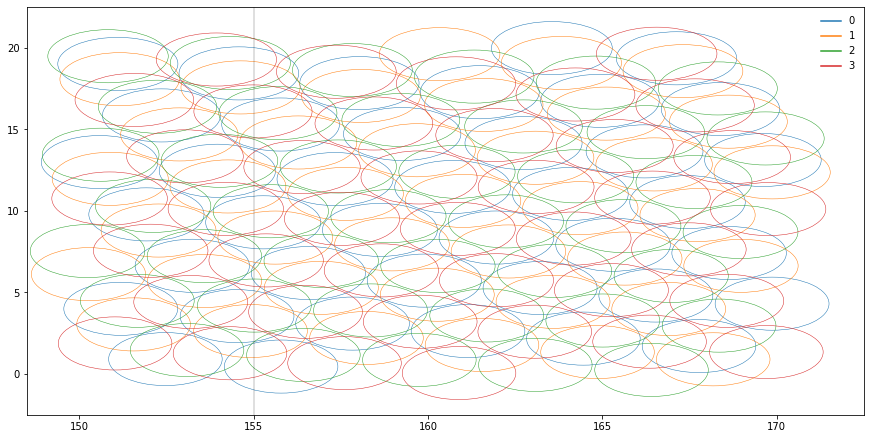

In [14]:
fig, ax = plt.subplots(1,1,figsize=(15,7.5))

plt.sca(ax)

for ppass, color in zip(range(4), colors):
    in_pass=btiles['PASS'] == ppass
    
    # s : scalar or array_like, shape (n, ).  Radius of circles.
    # circles(btiles['RA'][in_pass], btiles['DEC'][in_pass], s=tile_rad, c=color, fc='none', label=ppass)
    
    theta = (np.pi / 2.) - (btiles['DEC'][in_pass] * np.pi / 180.) 
    ellipses(btiles['RA'][in_pass], btiles['DEC'][in_pass], w=2.*tile_rad / np.sin(theta), h=2.*tile_rad, c=color, alpha=1., fc='none', lw=0.5)
    
    print(ppass, np.count_nonzero(in_pass))
    
    ax.plot(0., 0., color=color, label=ppass)
    
pl.axvline(155., c='k', alpha=1., lw=0.25)
pl.axvline(195., c='k', alpha=1., lw=0.25)

pl.axhline(45., c='k', alpha=1., lw=0.25)
pl.axhline(55., c='k', alpha=1., lw=0.25)

ax.set_xlim(148.5, 172.5)
ax.set_ylim(-2.5, 22.5)

ax.legend(frameon=False)

In [15]:
skies = Table.read(root + '/sky_onepct.fits')

In [16]:
skies

RELEASE,BRICKID,BRICKNAME,BRICK_OBJID,RA,DEC,BLOBDIST,FIBERFLUX_G,FIBERFLUX_R,FIBERFLUX_Z,FIBERFLUX_IVAR_G,FIBERFLUX_IVAR_R,FIBERFLUX_IVAR_Z,TARGETID,DESI_TARGET,BGS_TARGET,MWS_TARGET,SUBPRIORITY,OBSCONDITIONS,PRIORITY_INIT,NUMOBS_INIT,HPXPIXEL
int32,int32,bytes8,int32,float64,float64,float32,float32,float32,float32,float32,float32,float32,int64,int64,int64,int64,float64,int64,int64,int64,int64
9010,332483,1688p002,0,168.99854010006163,0.12645961971088204,9.2499485,-0.010476363,0.0032781393,0.055474855,5066.677,1476.6414,284.85373,616088545903247360,4294967296,0,0,0.17665752623816489,63,-1,-1,26986
9010,332483,1688p002,1,168.99744843830416,0.12645962488312873,16.923206,-0.001785091,0.007349869,0.096458256,5047.172,1490.0508,284.5571,616088545903247361,4294967296,0,0,0.7079030585480359,63,-1,-1,26986
9010,332483,1688p002,2,168.98849680861125,0.12645966556390906,21.0,-0.013717791,-0.050545122,0.03526149,5068.132,1489.884,284.99728,616088545903247362,4294967296,0,0,0.7749958041164311,63,-1,-1,26986
9010,332483,1688p002,3,168.97758017957904,0.12645971099708053,15.92605,0.0059098443,0.009838562,0.01285153,5050.679,1476.4435,284.85373,616088545903247363,4294967296,0,0,0.8085191584183886,63,-1,-1,26986
9010,332483,1688p002,4,168.9687740933621,0.12645974430129686,21.0,-0.0054561053,0.033312276,0.015904855,5037.9355,1471.0006,285.54837,616088545903247364,4294967296,0,0,0.9623725369228879,63,-1,-1,26986
9010,332483,1688p002,5,168.9672457638864,0.12645974977713964,21.0,-0.028236331,0.0057330597,-0.042233318,5093.0337,1481.8506,286.04175,616088545903247365,4294967296,0,0,0.9434194218055479,63,-1,-1,26986
9010,332483,1688p002,6,168.95545578939658,0.12645978899514285,21.0,-0.011172959,-0.02273459,0.046138637,5059.427,1487.3851,285.69003,616088545903247366,4294967296,0,0,0.14772319709598558,63,-1,-1,26986
9010,332483,1688p002,7,168.9526174611493,0.12645979763678003,21.0,-0.006842845,0.058177546,0.032166444,5061.439,1466.5006,285.27417,616088545903247367,4294967296,0,0,0.8220110945044256,63,-1,-1,26986
9010,332483,1688p002,8,168.94584913843278,0.12645981699147743,21.0,0.020555437,0.00844012,-0.014334475,5041.8013,1473.8687,285.84296,616088545903247368,4294967296,0,0,0.9303867067210182,63,-1,-1,26986


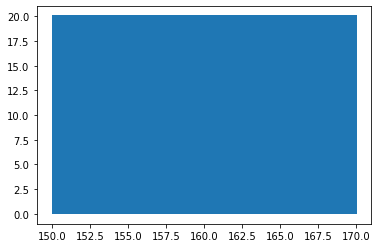

In [17]:
pl.plot(skies['RA'], skies['DEC'], marker=',', lw=0.0)

In [18]:
mtl = Table.read(root + '/mtl_bright_sv3_onepct.fits', 'MTL')

In [19]:
mtl

BRICKNAME,RA,DEC,FLUX_G,FLUX_R,FLUX_Z,MW_TRANSMISSION_G,MW_TRANSMISSION_R,MW_TRANSMISSION_Z,FLUX_W1,FLUX_W2,MW_TRANSMISSION_W1,MW_TRANSMISSION_W2,FIBERFLUX_R,TARGETID,SV3_DESI_TARGET,SV3_BGS_TARGET,SV3_MWS_TARGET,SUBPRIORITY,PRIORITY_INIT,NUMOBS_INIT,SV3_SCND_TARGET,HPXPIXEL,NUMOBS_MORE,NUMOBS,Z,ZWARN,ZTILEID,TARGET_STATE,TIMESTAMP,VERSION,PRIORITY,OBSCONDITIONS
bytes8,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int64,int64,int64,int64,float64,int64,int64,int64,int64,int64,int64,float64,int64,int32,bytes16,bytes19,bytes14,int64,int32
1696p002,169.5003978765996,0.20882740685358553,33.55514,126.7521,393.41602,0.89634156,0.9289352,0.9596051,250.79063,153.97464,0.99375457,0.99615985,94.69138,39627793612406832,2305843009213693952,0,33,0.10965626294738706,101400,9,0,26986,9,0,-1.0,-1,-1,MWS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,101400,516
1696p002,169.50363400321137,0.3550079398675022,46.02874,71.37002,83.59966,0.89665234,0.9291522,0.95973045,22.393543,13.1889715,0.9937743,0.996172,55.517654,39627793612406888,2305843009213693952,0,1280,0.7792757787691276,101500,9,0,26986,9,0,-1.0,-1,-1,MWS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,101500,516
1696p002,169.5060575763637,0.35267505295752083,3.318318,16.47131,40.91823,0.89684963,0.9292899,0.95981,70.68808,47.24155,0.9937868,0.9961797,6.3424745,39627793612406931,1152921504606846976,131074,0,0.39853834376649133,102100,1,0,26986,1,0,-1.0,-1,-1,BGS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,102100,516
1696p002,169.50611598389952,0.13164169411042556,12.063033,32.67438,60.794804,0.89131624,0.9254238,0.9575744,72.26833,56.644276,0.9934347,0.995963,7.7688937,39627793612406932,1152921504606846976,131074,0,0.9792136313393814,102100,1,0,26986,1,0,-1.0,-1,-1,BGS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,102100,516
1696p002,169.506148947179,0.30744812139544564,120.40932,233.43233,398.60684,0.89696455,0.9293701,0.95985633,388.83514,294.82925,0.9937941,0.9961842,17.463968,39627793612406933,1152921504606846976,131074,0,0.9460035095411022,102100,1,0,26986,1,0,-1.0,-1,-1,BGS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,102100,516
1696p002,169.50669453558885,0.21659554822406984,114.73329,330.9538,593.9596,0.89709586,0.9294618,0.9599093,310.55957,175.26068,0.9938024,0.9961893,253.56033,39627793612406946,2305843009213693952,0,33,0.14336154906844856,101400,9,0,26986,9,0,-1.0,-1,-1,MWS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,101400,516
1696p002,169.50728562431718,0.1742253914795791,225.25587,327.71155,358.08994,0.89523107,0.92815983,0.959157,95.75161,49.081177,0.99368405,0.9961164,254.52238,39627793612406961,2305843009213693952,0,1280,0.07377416140742443,101500,9,0,26986,9,0,-1.0,-1,-1,MWS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,101500,516
1696p002,169.50866423527933,0.1728950299199725,4.57769,9.598394,16.411657,0.89527285,0.928189,0.9591738,15.808878,10.061556,0.9936867,0.99611807,4.3558083,39627793612406992,1152921504606846976,65537,0,0.39517611803402153,102000,1,0,26986,1,0,-1.0,-1,-1,BGS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,102000,516
1696p002,169.50872898684602,0.3074599757023381,74.44535,137.72365,178.41702,0.89727795,0.92958885,0.9599827,58.18396,27.330067,0.99381393,0.9961964,107.13639,39627793612406993,2305843009213693952,0,1280,0.7206618694784689,101500,9,0,26986,9,0,-1.0,-1,-1,MWS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,101500,516


In [20]:
np.unique(mtl['PRIORITY_INIT'])

-1
90
101400
101500
101550
101600
102000
102100
102998


In [21]:
np.unique(mtl['PRIORITY'])

0
90
101400
101500
101550
101600
102000
102100
102998


In [22]:
# mtl[mtl['TARGETID'] == 39633260032033629]

0 40
1 39
2 41
3 40


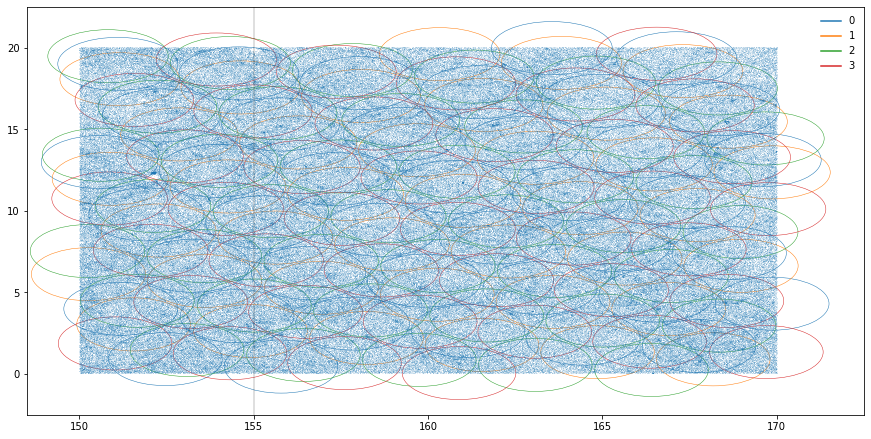

In [23]:
fig, ax = plt.subplots(1,1,figsize=(15,7.5))

plt.sca(ax)

ax.plot(mtl['RA'], mtl['DEC'], marker=',', lw=0.0, alpha=0.1)

for ppass, color in zip(range(4), colors):
    in_pass=btiles['PASS'] == ppass
    
    # s : scalar or array_like, shape (n, ).  Radius of circles.
    # circles(btiles['RA'][in_pass], btiles['DEC'][in_pass], s=tile_rad, c=color, fc='none', label=ppass)
    
    theta = (np.pi / 2.) - (btiles['DEC'][in_pass] * np.pi / 180.) 
    ellipses(btiles['RA'][in_pass], btiles['DEC'][in_pass], w=2.*tile_rad / np.sin(theta), h=2.*tile_rad, c=color, alpha=1., fc='none', lw=0.5)
    
    print(ppass, np.count_nonzero(in_pass))
    
    ax.plot(0., 0., color=color, label=ppass)
    
pl.axvline(155., c='k', alpha=1., lw=0.25)
pl.axvline(195., c='k', alpha=1., lw=0.25)

pl.axhline(45., c='k', alpha=1., lw=0.25)
pl.axhline(55., c='k', alpha=1., lw=0.25)

ax.set_xlim(148.5, 172.5)
ax.set_ylim(-2.5, 22.5)

ax.legend(frameon=False)

In [24]:
len(btiles), 37 + 37 + 35 + 37

(160, 146)

In [25]:
20. * 20.

400.0

In [26]:
# in_footprint, indx = is_point_in_desi(btiles, mtl['RA'], mtl['DEC'], radius=tile_rad, return_tile_index=True)

In [27]:
files = sorted(glob.glob(root + '/fba-*.fits'))

In [28]:
files

['/project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/fba-063483.fits',
 '/project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/fba-063484.fits',
 '/project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/fba-063486.fits',
 '/project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/fba-063488.fits',
 '/project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/fba-063489.fits',
 '/project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/fba-063490.fits',
 '/project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/fba-063492.fits',
 '/project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/fba-063495.fits',
 '/project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/fba-063508.fits',
 '/project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/fba-063511.fits',
 '/project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/fba-063512.fits',
 '/project

In [29]:
fbas = [fits.open(f) for f in files]

In [30]:
fbas[0].info()

Filename: /project/projectdirs/desi/users/forero/sv3_tests/bright_test_20210415/fba-063483.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      35   ()      
  1  FASSIGN       1 BinTableHDU     65   5020R x 14C   [J, K, J, J, E, I, J, 3A, D, D, K, B, E, E]   
  2  FTARGETS      1 BinTableHDU     53   4206R x 8C   [K, D, D, K, B, J, D, J]   
  3  FAVAIL        1 BinTableHDU     43   156837R x 3C   [J, J, K]   


In [31]:
# for fba in fbas:
#    print(np.unique(fba['FTARGETS'].data['PRIORITY']))

In [32]:
# https://github.com/desihub/fiberassign/blob/06240acab043eb3d8ffbe31ab29a29d56a031f3f/src/hardware.h#L24-L28
# define FIBER_STATE_OK 0
# define FIBER_STATE_UNASSIGNED 1
# define FIBER_STATE_STUCK 2
# define FIBER_STATE_BROKEN 4
# define FIBER_STATE_RESTRICT 8
np.unique(fbas[0][1].data['FIBERSTATUS'], return_counts=True)

(array([ 0,  1,  3,  8,  9, 11, 15], dtype=int32),
 array([4190,   82,  503,   16,   13,  177,   39]))

In [33]:
# Fiber state is just ok. 
np.count_nonzero(fbas[0][1].data['FIBERSTATUS'] == 0)

4190

In [34]:
# Fiber state is just unassigned.
np.count_nonzero(fbas[0][1].data['FIBERSTATUS'] == 1)

82

In [35]:
# Fiber state satisfies ok.
np.count_nonzero((fbas[0][1].data['FIBERSTATUS'] & 2**0) == 0)

4206

In [36]:
# Fiber state satisfies unassigned. 
np.count_nonzero((fbas[0][1].data['FIBERSTATUS'] & 2**0) != 0)

814

In [37]:
# Ok: can be restricted. 
np.unique(fbas[0][1].data['FIBERSTATUS'][(fbas[0][1].data['FIBERSTATUS'] & 2**0) == 0], return_counts=True)

(array([0, 8], dtype=int32), array([4190,   16]))

In [38]:
# Unassigned: 
np.unique(fbas[0][1].data['FIBERSTATUS'][fbas[0][1].data['FIBERSTATUS'] == 1], return_counts=True)

(array([1], dtype=int32), array([82]))

In [39]:
# Unassigned: can be stuck, restricted, etc.
np.unique(fbas[0][1].data['FIBERSTATUS'][(fbas[0][1].data['FIBERSTATUS'] & 2**0) != 0], return_counts=True)

(array([ 1,  3,  9, 11, 15], dtype=int32), array([ 82, 503,  13, 177,  39]))

OK             	4206
UNASSIGNED     	814
STUCK          	719
BROKEN         	39
RESTRICT       	245


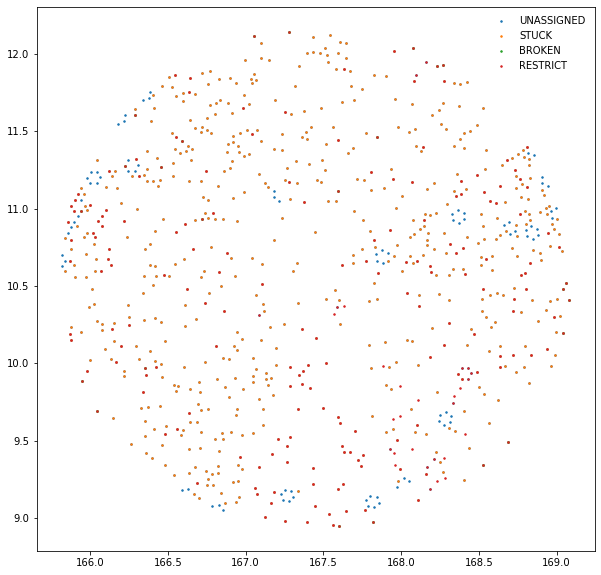

In [40]:
fig, ax = plt.subplots(1,1,figsize=(10,10))

print('{}\t{}'.format('OK'.ljust(15), np.count_nonzero((fbas[0][1].data['FIBERSTATUS'] & 2**0) == 0)))

for label, bit, color in zip(['UNASSIGNED', 'STUCK', 'BROKEN', 'RESTRICT'], [0, 1, 2, 3], colors):
    is_type = (fbas[0][1].data['FIBERSTATUS'] & 2**bit) != 0
    
    print('{}\t{}'.format(label.ljust(15), np.count_nonzero(is_type)))
    
    ax.plot(fbas[0][1].data['TARGET_RA'][is_type], fbas[0][1].data['TARGET_DEC'][is_type], marker='.', lw=0.0, markersize=3, label=label)
    ax.legend(frameon=False)

In [41]:
# https://github.com/desihub/fiberassign/blob/bcb3b508d6b924cc870db7124c637f87ef4b8387/src/targets.h
#
#define TARGET_TYPE_SCIENCE 1
#define TARGET_TYPE_STANDARD 2
#define TARGET_TYPE_SKY 4
#define TARGET_TYPE_SAFE 8
#define TARGET_TYPE_SUPPSKY 16

In [42]:
np.unique(fbas[0]['FASSIGN'].data['FA_TYPE'])

array([0, 1, 2, 3, 4, 8], dtype=uint8)

SCIENCE        	3788
STANDARD       	110
SKY            	415
SAFE           	2
SUPPSKY        	0


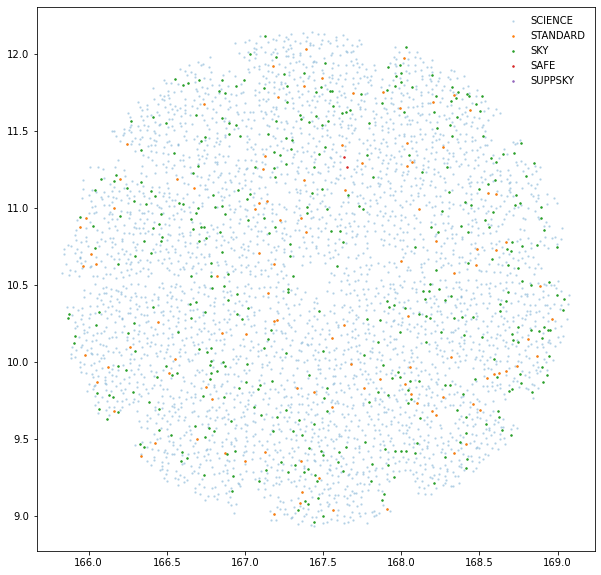

In [43]:
fig, ax = plt.subplots(1,1,figsize=(10,10))

for label, bit, color in zip(['SCIENCE', 'STANDARD', 'SKY', 'SAFE', 'SUPPSKY'], [0, 1, 2, 3, 4], colors):
    is_type = (fbas[0]['FASSIGN'].data['FA_TYPE'] & 2**bit) != 0
    
    print('{}\t{}'.format(label.ljust(15), np.count_nonzero(is_type)))
    
    if label == 'SCIENCE':
        alpha=0.2
    else:
        alpha=1.0
    
    ax.plot(fbas[0][1].data['TARGET_RA'][is_type], fbas[0][1].data['TARGET_DEC'][is_type], marker='.', lw=0.0, markersize=3, label=label, alpha=alpha)
    ax.legend(frameon=False)

In [44]:
# OK             	3441
# UNASSIGNED     	1579
# STUCK          	719
# BROKEN         	39
# RESTRICT       	245

In [45]:
for i, fba in enumerate(fbas):
    print('\n')
    
    for label, bit, color in zip(['UNASSIGNED', 'STUCK', 'BROKEN', 'RESTRICT'], [0, 1, 2, 3], colors):
        is_type = (fba[1].data['FIBERSTATUS'] & 2**bit) != 0
    
        print('{}\t{}'.format(label.ljust(15), np.count_nonzero(is_type)))
    
    if i > 10:
        break



UNASSIGNED     	814
STUCK          	719
BROKEN         	39
RESTRICT       	245


UNASSIGNED     	934
STUCK          	719
BROKEN         	39
RESTRICT       	245


UNASSIGNED     	2259
STUCK          	719
BROKEN         	39
RESTRICT       	245


UNASSIGNED     	814
STUCK          	719
BROKEN         	39
RESTRICT       	245


UNASSIGNED     	815
STUCK          	719
BROKEN         	39
RESTRICT       	245


UNASSIGNED     	812
STUCK          	719
BROKEN         	39
RESTRICT       	245


UNASSIGNED     	2672
STUCK          	719
BROKEN         	39
RESTRICT       	245


UNASSIGNED     	817
STUCK          	719
BROKEN         	39
RESTRICT       	245


UNASSIGNED     	1865
STUCK          	719
BROKEN         	39
RESTRICT       	245


UNASSIGNED     	813
STUCK          	719
BROKEN         	39
RESTRICT       	245


UNASSIGNED     	810
STUCK          	719
BROKEN         	39
RESTRICT       	245


UNASSIGNED     	813
STUCK          	719
BROKEN         	39
RESTRICT       	245


In [46]:
# 40 skies & 10 standards per petal.

0 40
1 39
2 41
3 40


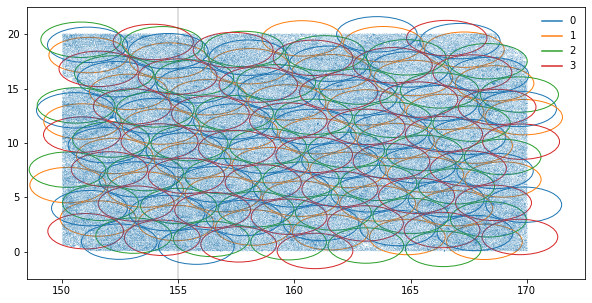

In [47]:
fig, ax = plt.subplots(1,1,figsize=(10,5))

plt.sca(ax)

avail = []

for fba in fbas:
    avail += fba['FAVAIL'].data['TARGETID'].tolist()
    
avail = np.unique(avail)
    
in_footprint = np.isin(mtl['TARGETID'], avail)
    
pl.plot(mtl['RA'][in_footprint], mtl['DEC'][in_footprint], marker=',', lw=0.0, alpha=0.05, c=colors[0])

for ppass, color in zip(range(4), colors):
    in_pass=btiles['PASS'] == ppass
    # circles(btiles['RA'][in_pass], btiles['DEC'][in_pass], s=tile_rad, c=color, fc='none', label=ppass)

    theta = (np.pi / 2.) - (btiles['DEC'][in_pass] * np.pi / 180.) 
    ellipses(btiles['RA'][in_pass], btiles['DEC'][in_pass], w=2.*tile_rad / np.sin(theta), h=2.*tile_rad, c=color, fc='none', alpha=1.)
    
    print(ppass, np.count_nonzero(in_pass))
    
    ax.plot(0., 0., color=color, label=ppass)

# 256 sqdeg around 155<ra<195, 45<dec<55)
pl.axvline(155., c='k', alpha=1., lw=0.25)
pl.axvline(195., c='k', alpha=1., lw=0.25)

pl.axhline(45., c='k', alpha=1., lw=0.25)
pl.axhline(55., c='k', alpha=1., lw=0.25)

ax.set_xlim(148.5, 172.5)
ax.set_ylim(-2.5, 22.5)

ax.legend(frameon=False)

0 40
1 39
2 41
3 40


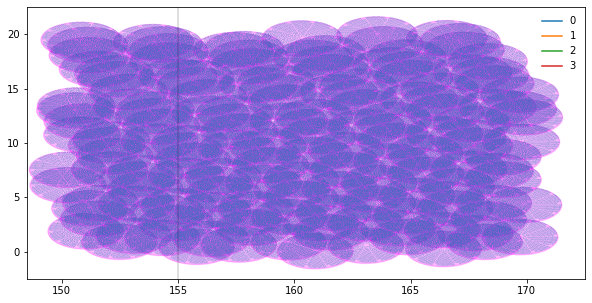

In [48]:
fig, ax = plt.subplots(1,1,figsize=(10,5))

plt.sca(ax)

for ppass, color in zip(range(4), colors):
    in_pass=btiles['PASS'] == ppass
    
    # circles(btiles['RA'][in_pass], btiles['DEC'][in_pass], s=tile_rad, c=color, fc='none', label=ppass)

    theta = (np.pi / 2.) - (btiles['DEC'][in_pass] * np.pi / 180.) 
    ellipses(btiles['RA'][in_pass], btiles['DEC'][in_pass], w=2.*tile_rad / np.sin(theta), h=2.*tile_rad, c='magenta', alpha=0.2)

    print(ppass, np.count_nonzero(in_pass))
    
    ax.plot(0., 0., color=color, label=ppass)
    
for fba in fbas:
    ra = fba[0].header['TILERA']
    dec = fba[0].header['TILEDEC']
    
    # circles(ra, dec, s=tile_rad, c='magenta', fc='none')
    
    theta = (np.pi / 2.) - (dec * np.pi / 180.) 
    ellipses(ra, dec, w=2.*tile_rad / np.sin(theta), h=2.*tile_rad, c='magenta', alpha=0.1)
    
for fba in fbas:
    pl.plot(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'], marker=',', lw=0.0, alpha=0.1, c=colors[0])
    
# 256 sqdeg around 155<ra<195, 45<dec<55)
pl.axvline(155., c='k', alpha=1., lw=0.25)
pl.axvline(195., c='k', alpha=1., lw=0.25)

pl.axhline(45., c='k', alpha=1., lw=0.25)
pl.axhline(55., c='k', alpha=1., lw=0.25)

ax.set_xlim(148.5, 172.5)
ax.set_ylim(-2.5, 22.5)

ax.legend(frameon=False)

In [49]:
mtl

BRICKNAME,RA,DEC,FLUX_G,FLUX_R,FLUX_Z,MW_TRANSMISSION_G,MW_TRANSMISSION_R,MW_TRANSMISSION_Z,FLUX_W1,FLUX_W2,MW_TRANSMISSION_W1,MW_TRANSMISSION_W2,FIBERFLUX_R,TARGETID,SV3_DESI_TARGET,SV3_BGS_TARGET,SV3_MWS_TARGET,SUBPRIORITY,PRIORITY_INIT,NUMOBS_INIT,SV3_SCND_TARGET,HPXPIXEL,NUMOBS_MORE,NUMOBS,Z,ZWARN,ZTILEID,TARGET_STATE,TIMESTAMP,VERSION,PRIORITY,OBSCONDITIONS
bytes8,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int64,int64,int64,int64,float64,int64,int64,int64,int64,int64,int64,float64,int64,int32,bytes16,bytes19,bytes14,int64,int32
1696p002,169.5003978765996,0.20882740685358553,33.55514,126.7521,393.41602,0.89634156,0.9289352,0.9596051,250.79063,153.97464,0.99375457,0.99615985,94.69138,39627793612406832,2305843009213693952,0,33,0.10965626294738706,101400,9,0,26986,9,0,-1.0,-1,-1,MWS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,101400,516
1696p002,169.50363400321137,0.3550079398675022,46.02874,71.37002,83.59966,0.89665234,0.9291522,0.95973045,22.393543,13.1889715,0.9937743,0.996172,55.517654,39627793612406888,2305843009213693952,0,1280,0.7792757787691276,101500,9,0,26986,9,0,-1.0,-1,-1,MWS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,101500,516
1696p002,169.5060575763637,0.35267505295752083,3.318318,16.47131,40.91823,0.89684963,0.9292899,0.95981,70.68808,47.24155,0.9937868,0.9961797,6.3424745,39627793612406931,1152921504606846976,131074,0,0.39853834376649133,102100,1,0,26986,1,0,-1.0,-1,-1,BGS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,102100,516
1696p002,169.50611598389952,0.13164169411042556,12.063033,32.67438,60.794804,0.89131624,0.9254238,0.9575744,72.26833,56.644276,0.9934347,0.995963,7.7688937,39627793612406932,1152921504606846976,131074,0,0.9792136313393814,102100,1,0,26986,1,0,-1.0,-1,-1,BGS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,102100,516
1696p002,169.506148947179,0.30744812139544564,120.40932,233.43233,398.60684,0.89696455,0.9293701,0.95985633,388.83514,294.82925,0.9937941,0.9961842,17.463968,39627793612406933,1152921504606846976,131074,0,0.9460035095411022,102100,1,0,26986,1,0,-1.0,-1,-1,BGS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,102100,516
1696p002,169.50669453558885,0.21659554822406984,114.73329,330.9538,593.9596,0.89709586,0.9294618,0.9599093,310.55957,175.26068,0.9938024,0.9961893,253.56033,39627793612406946,2305843009213693952,0,33,0.14336154906844856,101400,9,0,26986,9,0,-1.0,-1,-1,MWS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,101400,516
1696p002,169.50728562431718,0.1742253914795791,225.25587,327.71155,358.08994,0.89523107,0.92815983,0.959157,95.75161,49.081177,0.99368405,0.9961164,254.52238,39627793612406961,2305843009213693952,0,1280,0.07377416140742443,101500,9,0,26986,9,0,-1.0,-1,-1,MWS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,101500,516
1696p002,169.50866423527933,0.1728950299199725,4.57769,9.598394,16.411657,0.89527285,0.928189,0.9591738,15.808878,10.061556,0.9936867,0.99611807,4.3558083,39627793612406992,1152921504606846976,65537,0,0.39517611803402153,102000,1,0,26986,1,0,-1.0,-1,-1,BGS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,102000,516
1696p002,169.50872898684602,0.3074599757023381,74.44535,137.72365,178.41702,0.89727795,0.92958885,0.9599827,58.18396,27.330067,0.99381393,0.9961964,107.13639,39627793612406993,2305843009213693952,0,1280,0.7206618694784689,101500,9,0,26986,9,0,-1.0,-1,-1,MWS|UNOBS,2021-04-15T17:20:48,0.57.1.dev4806,101500,516


In [50]:
# Jaime's
bgs_mtl = mtl[(mtl['SV3_DESI_TARGET'].data & desi_mask['BGS_ANY']) != 0]
mws_mtl = mtl[(mtl['SV3_DESI_TARGET'].data & desi_mask['MWS_ANY']) != 0]

In [51]:
len(bgs_mtl) / len(mws_mtl)

1.694189680572942

In [52]:
area = (20. - 0.) * (170. - 150.)
area

400.0

In [53]:
len(bgs_mtl) / area, len(mws_mtl) / area

(1492.1025, 880.7175)

In [54]:
for tt in ['BGS_FAINT', 'BGS_BRIGHT', 'BGS_WISE', 'BGS_FAINT_HIP']:
    print('{}\t{:.4f}'.format(tt.ljust(15), np.count_nonzero((bgs_mtl['SV3_BGS_TARGET'] & bgs_mask[tt]) != 0) / area))

BGS_FAINT      	618.3675
BGS_BRIGHT     	870.9600
BGS_WISE       	2.7750
BGS_FAINT_HIP  	123.6675


In [55]:
618.3675 + 870.9600 + 2.7750

1492.1025

In [56]:
for tt in ['MWS_BROAD', 'MWS_WD', 'MWS_NEARBY', 'MWS_BHB', 'MWS_MAIN_BLUE', 'MWS_MAIN_RED']:
    print('{}\t{:.4f}'.format(tt.ljust(15), np.count_nonzero((mws_mtl['SV3_MWS_TARGET'] & mws_mask[tt]) != 0) / area))

MWS_BROAD      	458.7675
MWS_WD         	3.7800
MWS_NEARBY     	2.1225
MWS_BHB        	1.8150
MWS_MAIN_BLUE  	344.3950
MWS_MAIN_RED   	73.9950


In [57]:
458.7675 + 344.3950 + 73.9950

877.1574999999999

In [58]:
columns      = ['TARGETID', 'RA', 'DEC', 'SV3_DESI_TARGET', 'SV3_BGS_TARGET', 'SV3_MWS_TARGET', 'PRIORITY_INIT']

In [59]:
bright_sv3   = read_targets_in_tiles('/global/cfs/cdirs/desi/target/catalogs/dr9/0.57.0/targets/sv3/resolve/bright/', columns=columns) 

In [60]:
bgs_mtl_sv3  = bright_sv3[(bright_sv3['SV3_DESI_TARGET'] & desi_mask['BGS_ANY']) != 0]

In [61]:
mws_mtl_sv3  = bright_sv3[(bright_sv3['SV3_DESI_TARGET'] & desi_mask['MWS_ANY']) != 0]

In [62]:
len(bgs_mtl_sv3) / len(mws_mtl_sv3)

0.849548787061338

In [63]:
hdr          = fits.open('/global/cfs/cdirs/desi/target/catalogs/dr9/0.57.0/pixweight/sv3/resolve/bright/sv3pixweight-1-bright.fits')[1].header
hp_area      = hp.nside2pixarea(hdr['HPXNSIDE'], degrees=True)
pixweights   = Table.read('/global/cfs/cdirs/desi/target/catalogs/dr9/0.57.0/pixweight/sv3/resolve/bright/sv3pixweight-1-bright.fits', 'PIXWEIGHTS')
area         = np.sum(hp_area * pixweights['FRACAREA'])

In [64]:
len(pixweights)

786432

In [65]:
hdr['HPXNSIDE']

256

In [66]:
# Number of pixels required for a 600. sq. deg. area.
400. / hp_area

7625.459857246692

In [67]:
area

19721.268

In [68]:
for tt in ['BGS_FAINT', 'BGS_BRIGHT', 'BGS_WISE', 'BGS_FAINT_HIP']:
    print('{}\t{:.4f}'.format(tt.ljust(15), np.count_nonzero((bgs_mtl_sv3['SV3_BGS_TARGET'] & bgs_mask[tt]) != 0) / area))

BGS_FAINT      	455.1897
BGS_BRIGHT     	638.8971
BGS_WISE       	2.2987
BGS_FAINT_HIP  	91.0077


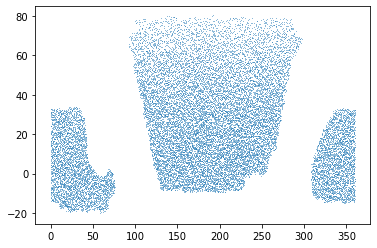

In [69]:
pl.plot(bgs_mtl_sv3['RA'][::1000], bgs_mtl_sv3['DEC'][::1000], marker=',', lw=0.0, alpha=0.5)

In [70]:
for tt in ['MWS_BROAD', 'MWS_WD', 'MWS_NEARBY', 'MWS_BHB', 'MWS_MAIN_BLUE', 'MWS_MAIN_RED']:
    print('{}\t{:.4f}'.format(tt.ljust(15), np.count_nonzero((mws_mtl_sv3['SV3_MWS_TARGET'] & mws_mask[tt]) != 0) / area))

MWS_BROAD      	504.2895
MWS_WD         	3.4287
MWS_NEARBY     	1.8106
MWS_BHB        	1.6332
MWS_MAIN_BLUE  	594.5028
MWS_MAIN_RED   	188.4825


In [71]:
pixweights

HPXPIXEL,FRACAREA,STARDENS,EBV,PSFDEPTH_G,PSFDEPTH_R,PSFDEPTH_Z,GALDEPTH_G,GALDEPTH_R,GALDEPTH_Z,PSFDEPTH_W1,PSFDEPTH_W2,PSFSIZE_G,PSFSIZE_R,PSFSIZE_Z,FRACAREA_12290,FRACAREA_8194,LRG,ELG,QSO,LRG_LOWDENS,QSO_HIZ,ELG_LOP,ELG_HIP,STD_FAINT,STD_WD,STD_BRIGHT,BGS_ANY,MWS_ANY,BGS_FAINT,BGS_BRIGHT,BGS_WISE,BGS_FAINT_HIP,MWS_BROAD,MWS_WD,MWS_NEARBY,MWS_BHB,MWS_MAIN_BLUE,MWS_MAIN_RED,GAIA_STD_FAINT,GAIA_STD_WD,GAIA_STD_BRIGHT
int32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32
0,0.9900389,457.5276,0.08946405,2977.8577,2111.599,303.1023,1821.5525,1114.314,140.34055,3.1497755,0.9279747,1.4065882,1.1538563,1.0177202,0.97521156,0.97521156,114.3819,0.0,0.0,114.3819,0.0,0.0,0.0,57.19095,0.0,19.06365,1429.7737,915.0552,629.10046,800.6733,0.0,76.2546,495.65488,0.0,0.0,0.0,324.08203,95.318245,0.0,0.0,0.0
1,1.0192698,495.65488,0.10813105,3064.0999,2138.0403,304.25555,1879.003,1137.2579,140.91148,3.1152415,0.90928364,1.4197367,1.163173,1.011294,0.9959698,0.9959698,95.318245,0.0,38.1273,95.318245,0.0,0.0,0.0,38.1273,0.0,0.0,1086.628,934.11884,362.20935,724.4187,0.0,38.1273,400.33664,0.0,0.0,0.0,419.4003,114.3819,0.0,0.0,0.0
2,1.0290134,324.08203,0.08350355,2874.9731,2199.3552,280.90164,1680.6434,1143.8859,136.51419,3.1332588,0.91563445,1.3761934,1.1633974,1.0695579,1.026048,1.026048,133.44554,0.0,19.06365,114.3819,0.0,0.0,0.0,95.318245,0.0,38.1273,3164.566,915.0552,1010.3734,2154.1924,0.0,266.89108,362.20935,0.0,0.0,0.0,457.5276,95.318245,0.0,0.0,0.0
3,1.0184225,305.0184,0.09014927,2740.5693,2004.0542,266.25592,1615.0958,1026.9991,127.36264,3.0885131,0.9050113,1.4069579,1.1814529,1.0720681,1.0044426,1.0044426,76.2546,19.06365,19.06365,38.1273,0.0,0.0,19.06365,38.1273,0.0,19.06365,1181.9463,934.11884,476.59125,686.2914,19.06365,57.19095,457.5276,0.0,0.0,0.0,343.1457,133.44554,0.0,0.0,0.0
4,1.0658698,590.97314,0.10676067,2610.1345,1727.0626,255.1263,1645.0043,923.22174,117.74511,3.0605025,0.88255334,1.5032152,1.2117238,1.0086362,1.0650226,1.0650226,76.2546,0.0,0.0,76.2546,0.0,0.0,0.0,57.19095,0.0,0.0,1124.7554,972.24615,419.4003,705.35504,0.0,76.2546,552.8458,0.0,19.06365,0.0,324.08203,95.318245,0.0,0.0,0.0
5,0.9993589,514.71857,0.093880765,1780.0703,988.99445,156.61307,1225.1713,523.7707,71.72809,2.962528,0.85460085,1.6102151,1.2611288,1.0005262,0.988768,0.988768,57.19095,0.0,0.0,57.19095,0.0,0.0,0.0,19.06365,0.0,19.06365,876.92786,800.6733,381.27298,495.65488,0.0,95.318245,362.20935,0.0,0.0,19.06365,305.0184,133.44554,0.0,0.0,0.0
6,0.99808794,362.20935,0.0947393,3120.6008,1962.6942,283.80072,1908.306,1074.1082,136.10558,3.1322265,0.9154991,1.4464245,1.2252716,1.058445,0.99808794,0.99808794,19.06365,0.0,38.1273,0.0,0.0,0.0,0.0,57.19095,0.0,19.06365,1181.9463,991.30975,533.78217,629.10046,19.06365,57.19095,495.65488,0.0,0.0,0.0,400.33664,95.318245,0.0,0.0,0.0
7,1.0078316,285.95474,0.09281385,3190.3809,1567.185,271.73648,1908.8595,876.8345,127.795815,3.0035927,0.8740486,1.428307,1.2585714,1.0495304,0.993428,0.9985116,57.19095,0.0,0.0,19.06365,0.0,0.0,0.0,57.19095,0.0,38.1273,1162.8826,724.4187,400.33664,762.54596,0.0,95.318245,362.20935,0.0,0.0,0.0,209.70015,152.5092,0.0,0.0,0.0
8,1.0124916,552.8458,0.08121014,2633.6155,1811.4304,230.13573,1592.3162,970.7206,113.47637,3.1081643,0.9203713,1.4156421,1.194099,1.088748,0.99681705,0.99681705,133.44554,0.0,0.0,114.3819,0.0,0.0,0.0,0.0,19.06365,0.0,2001.6832,934.11884,724.4187,1277.2645,0.0,76.2546,457.5276,19.06365,19.06365,0.0,305.0184,171.57285,0.0,0.0,0.0


In [72]:
np.unique(pixweights['BGS_WISE'] * hp_area)

0.0
1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
11.0
13.0


In [73]:
hp_dec, hp_ra = Idx2DecRa(pixweights['HPXPIXEL'])

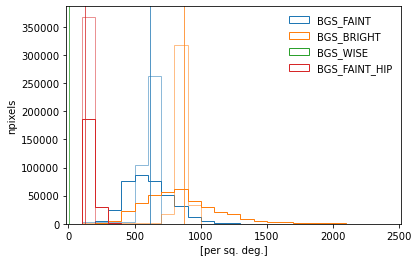

In [74]:
for i, (tt, color) in enumerate(zip(['BGS_FAINT', 'BGS_BRIGHT', 'BGS_WISE', 'BGS_FAINT_HIP'], colors)):
    isin = pixweights['FRACAREA'] > 0.85
    
    pl.hist(pixweights[tt][isin], bins=np.arange(100.0, 2500., 100.), histtype='step', label=tt, color=color, alpha=1.0)    
    pl.hist(np.convolve(pixweights[tt][isin], np.ones(7625)/7625.), bins=np.arange(100.0, 2500., 100.), histtype='step', color=color, alpha=0.5)
                
# BGS_FAINT      	618.3675
# BGS_BRIGHT     	870.9600
# BGS_WISE       	2.7750
# BGS_FAINT_HIP  	123.6675
      
for line, color in zip([618., 870., 3., 123.], colors):
    pl.axvline(line, color=color, lw=0.75)
    
pl.xlabel('[per sq. deg.]')
pl.ylabel('npixels')
pl.legend(frameon=False)

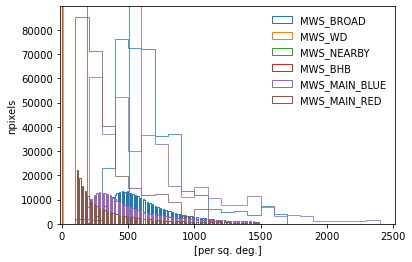

In [75]:
for tt, color in zip(['MWS_BROAD',	'MWS_WD', 'MWS_NEARBY',	'MWS_BHB', 'MWS_MAIN_BLUE', 'MWS_MAIN_RED'], colors):
    isin = pixweights['FRACAREA'] > 0.85

    pl.hist(pixweights[tt][isin], bins=np.arange(100.0, 1500., 10.), histtype='step', label=tt, color=color)
    pl.hist(np.convolve(pixweights[tt][isin], np.ones(7625)/7625.), bins=np.arange(100.0, 2500., 100.), histtype='step', color=color, alpha=0.75)

# MWS_BROAD      	504.2895
# MWS_WD         	3.4287
# MWS_NEARBY     	1.8106
# MWS_BHB        	1.6332
# MWS_MAIN_BLUE  	594.5028
# MWS_MAIN_RED   	188.4825

for line, color in zip([504., 3.5, 1.8, 1.6, 594., 188], colors):
    pl.axvline(line, color=color, lw=0.75)
    
pl.xlabel('[per sq. deg.]')
pl.ylabel('npixels')
pl.legend(frameon=False)

In [76]:
# BGS_BRIGHT:    {UNOBS: 102100, MORE_ZWARN: 102100, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# BGS_FAINT_HIP: {UNOBS: 102100, MORE_ZWARN: 102100, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# BGS_FAINT:     {UNOBS: 102000, MORE_ZWARN: 102000, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# BGS_WISE:      {UNOBS: 102000, MORE_ZWARN: 102000, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}

# https://arxiv.org/pdf/2010.11284.pdf ... 8M stars. 
# MWS_WD:        {UNOBS: 102998, MORE_ZWARN: 102998, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# MWS_NEARBY:    {UNOBS: 101600, MORE_ZWARN: 101600, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# MWS_BHB:       {UNOBS: 101550, MORE_ZWARN: 101550, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# MWS_MAIN_BLUE: {UNOBS: 101500, MORE_ZWARN: 101500, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# MWS_MAIN_RED:  {UNOBS: 101500, MORE_ZWARN: 101500, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}    
# MWS_BROAD:     {UNOBS: 101400, MORE_ZWARN: 101400, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}

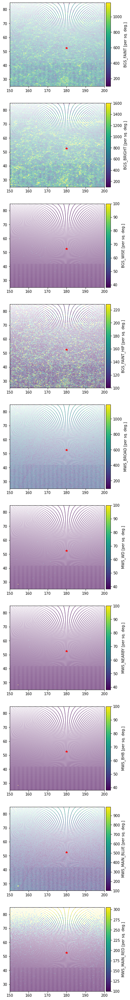

In [77]:
tts       = ['BGS_FAINT', 'BGS_BRIGHT', 'BGS_WISE', 'BGS_FAINT_HIP', 'MWS_BROAD',	'MWS_WD', 'MWS_NEARBY',	'MWS_BHB', 'MWS_MAIN_BLUE', 'MWS_MAIN_RED']
fig, axes = plt.subplots(len(tts), 1, figsize=(5, 5*len(tts)))

for i, tt in enumerate(tts):
    sc = axes[i].scatter(hp_ra, hp_dec, c=pixweights[tt], lw=0.0, s=1, vmin=100., vmax=2. * np.median(pixweights[tt][pixweights[tt] > 0.]))
    
    divider = make_axes_locatable(axes[i])
    cax = divider.append_axes('right', size='5%', pad=0.05)

    fig.colorbar(sc, cax=cax, orientation='vertical', label=tt + ' [per sq. deg.]')
    
    axes[i].plot(180., 52.5, c='r', marker='*')
    
    axes[i].set_xlim(150., 200.)
    axes[i].set_ylim(25.,   85.)

In [78]:
def in_rectange(ra, dec, area=False):
    if area:
        return (20.0 - 0.0) * (170. - 150.)
    
    return (ra > 150.) & (ra < 170.) & (dec > 0.0) & (dec < 20.)

def in_conservative_rectangle(ra, dec, area=False):    
    if area:
        return (19.0 - 1.0) * (169. - 151.)
    
    return (ra > 151) & (ra < 169.) & (dec > 1.0) & (dec < 19.0)

In [79]:
bgs_mtl_sv3 = bgs_mtl_sv3[in_rectange(bgs_mtl_sv3['RA'], bgs_mtl_sv3['DEC'])]
mws_mtl_sv3 = mws_mtl_sv3[in_rectange(mws_mtl_sv3['RA'], mws_mtl_sv3['DEC'])]

0 40
1 39
2 41
3 40


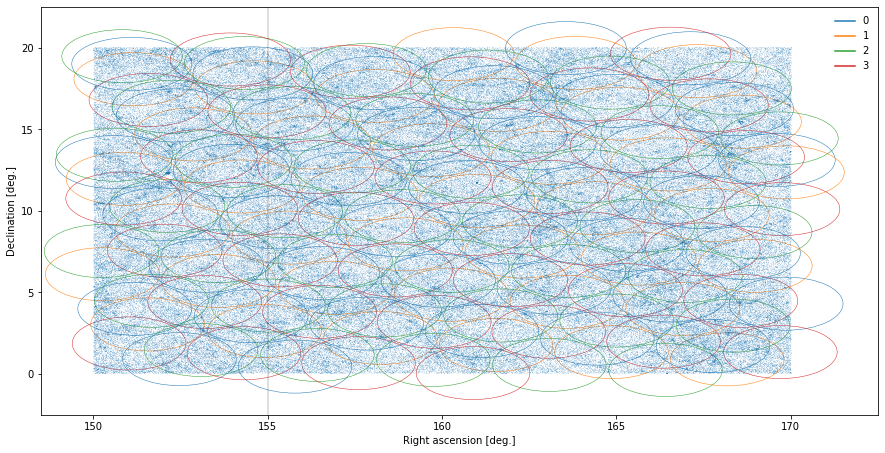

In [80]:
fig, ax = plt.subplots(1,1,figsize=(15,7.5))

plt.sca(ax)

ax.plot(bgs_mtl_sv3['RA'], bgs_mtl_sv3['DEC'], marker=',', lw=0.0, alpha=0.1)

for ppass, color in zip(range(4), colors):
    in_pass=btiles['PASS'] == ppass
    
    theta = (np.pi / 2.) - (btiles['DEC'][in_pass] * np.pi / 180.) 
    ellipses(btiles['RA'][in_pass], btiles['DEC'][in_pass], w=2.*tile_rad / np.sin(theta), h=2.*tile_rad, c=color, alpha=1., fc='none', lw=0.5)
    
    print(ppass, np.count_nonzero(in_pass))
    
    ax.plot(0., 0., color=color, label=ppass)
    
pl.axvline(155., c='k', alpha=1., lw=0.25)
pl.axvline(195., c='k', alpha=1., lw=0.25)

pl.axhline(45., c='k', alpha=1., lw=0.25)
pl.axhline(55., c='k', alpha=1., lw=0.25)

ax.set_xlim(148.5, 172.5)
ax.set_ylim(-2.5, 22.5)

ax.set_xlabel('Right ascension [deg.]')
ax.set_ylabel('Declination [deg.]')

ax.legend(frameon=False)

0 40
1 39
2 41
3 40


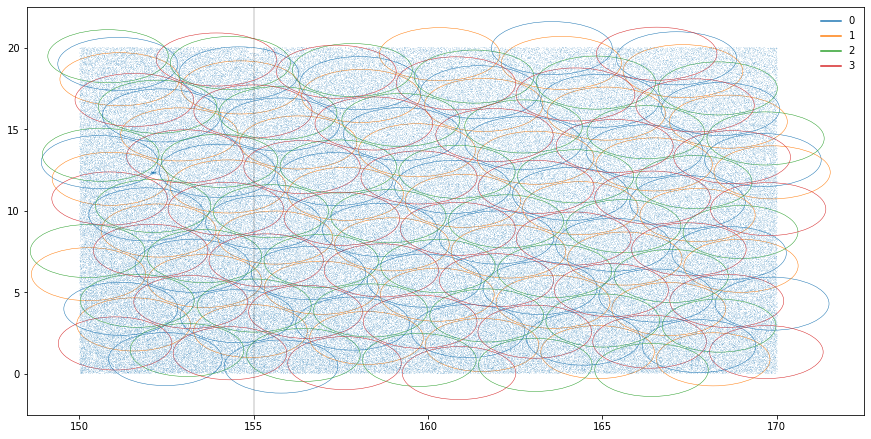

In [81]:
fig, ax = plt.subplots(1,1,figsize=(15,7.5))

plt.sca(ax)

ax.plot(mws_mtl_sv3['RA'], mws_mtl_sv3['DEC'], marker=',', lw=0.0, alpha=0.1)

for ppass, color in zip(range(4), colors):
    in_pass=btiles['PASS'] == ppass
    
    theta = (np.pi / 2.) - (btiles['DEC'][in_pass] * np.pi / 180.) 
    ellipses(btiles['RA'][in_pass], btiles['DEC'][in_pass], w=2.*tile_rad / np.sin(theta), h=2.*tile_rad, c=color, alpha=1., fc='none', lw=0.5)
    
    print(ppass, np.count_nonzero(in_pass))
    
    ax.plot(0., 0., color=color, label=ppass)
    
pl.axvline(155., c='k', alpha=1., lw=0.25)
pl.axvline(195., c='k', alpha=1., lw=0.25)

pl.axhline(45., c='k', alpha=1., lw=0.25)
pl.axhline(55., c='k', alpha=1., lw=0.25)

ax.set_xlim(148.5, 172.5)
ax.set_ylim(-2.5, 22.5)

ax.legend(frameon=False)

In [82]:
avail = []

for fba in fbas:
    avail += fba['FAVAIL'].data['TARGETID'].tolist()
    
avail = np.array(avail)

In [83]:
uavail, avail_cnts = np.unique(avail, return_counts=True)

In [84]:
np.unique(avail_cnts)

array([1, 2, 3, 4, 5, 6, 7, 8])

(0.0, 8.0)

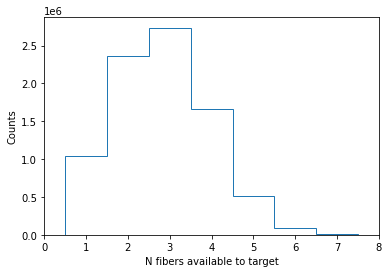

In [85]:
pl.hist(avail_cnts, histtype='step', bins=np.arange(15), align='left')
pl.xlabel('N fibers available to target')
pl.ylabel('Counts')
pl.xlim(0.0, 8.0)

Text(0, 0.5, 'Declination [deg.]')

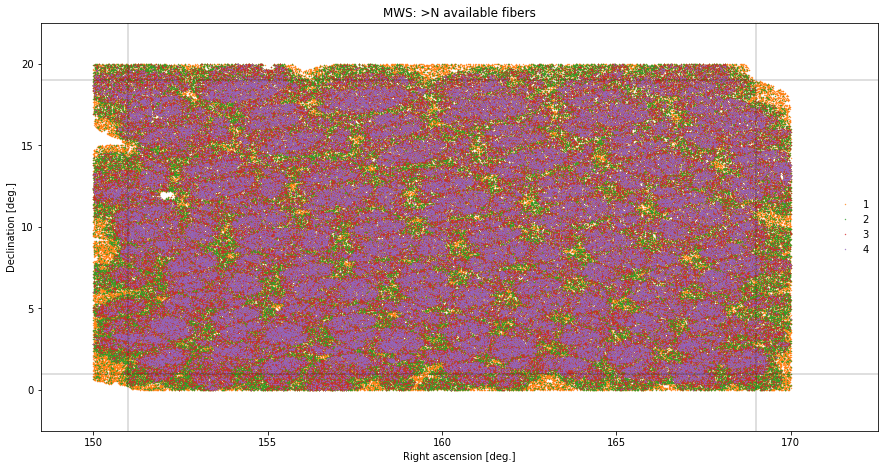

In [86]:
fig, ax = plt.subplots(1,1,figsize=(15,7.5))

plt.sca(ax)
  
for cnt, color in zip(np.arange(1, 5, 1), colors[1:]):
    to_plot = uavail[avail_cnts >= cnt]
    to_plot = np.isin(mws_mtl_sv3['TARGETID'], to_plot)
    
    ax.plot(mws_mtl_sv3['RA'][to_plot], mws_mtl_sv3['DEC'][to_plot], marker='.', lw=0.0, alpha=1., label=cnt, markersize=.75, color=color)
    
pl.axvline(151., c='k', alpha=1., lw=0.25)
pl.axvline(169., c='k', alpha=1., lw=0.25)

pl.axhline(1., c='k', alpha=1., lw=0.25)
pl.axhline(19., c='k', alpha=1., lw=0.25)

pl.title('MWS: >N available fibers')

ax.set_xlim(148.5, 172.5)
ax.set_ylim(-2.5, 22.5)

ax.legend(frameon=False)

ax.set_xlabel('Right ascension [deg.]')
ax.set_ylabel('Declination [deg.]')

In [87]:
in_conservative_rectangle(None, None, area=True)

324.0

0 40
1 39
2 41
3 40


Text(0, 0.5, 'Declination [deg.]')

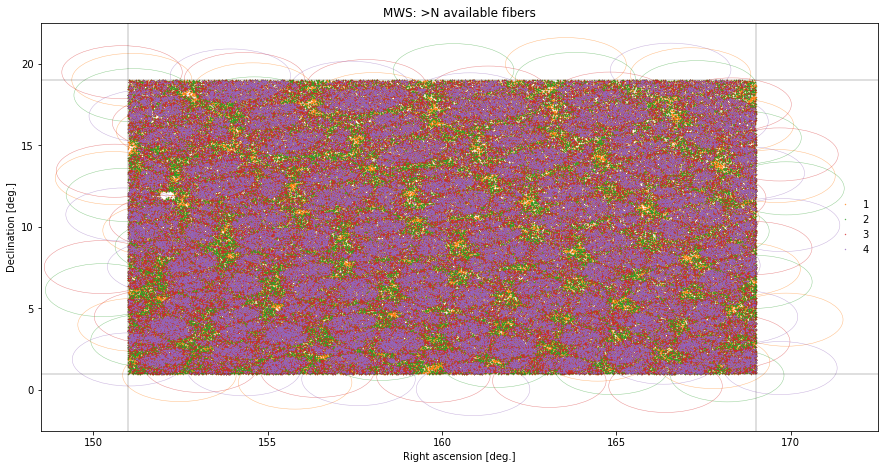

In [88]:
fig, ax = plt.subplots(1,1,figsize=(15,7.5))

plt.sca(ax)
  
for cnt, color in zip(np.arange(1, 5, 1), colors[1:]):
    to_plot = uavail[avail_cnts >= cnt]
    to_plot = np.isin(mws_mtl_sv3['TARGETID'], to_plot)
    to_plot = to_plot & in_conservative_rectangle(mws_mtl_sv3['RA'], mws_mtl_sv3['DEC'])
    
    ax.plot(mws_mtl_sv3['RA'][to_plot], mws_mtl_sv3['DEC'][to_plot], marker='.', lw=0.0, alpha=1., label=cnt, markersize=.75, color=color)
    
for ppass, color in zip(range(4), colors[1:]):
    in_pass=btiles['PASS'] == ppass
    
    theta = (np.pi / 2.) - (btiles['DEC'][in_pass] * np.pi / 180.) 
    ellipses(btiles['RA'][in_pass], btiles['DEC'][in_pass], w=2.*tile_rad / np.sin(theta), h=2.*tile_rad, c=color, alpha=.5, fc='none', lw=0.5)
    
    print(ppass, np.count_nonzero(in_pass))
    
    # ax.plot(0., 0., color=color, label=ppass)
    
pl.axvline(151., c='k', alpha=1., lw=0.25)
pl.axvline(169., c='k', alpha=1., lw=0.25)

pl.axhline(1., c='k', alpha=1., lw=0.25)
pl.axhline(19., c='k', alpha=1., lw=0.25)

pl.title('MWS: >N available fibers')

ax.set_xlim(148.5, 172.5)
ax.set_ylim(-2.5, 22.5)

ax.legend(frameon=False)

ax.set_xlabel('Right ascension [deg.]')
ax.set_ylabel('Declination [deg.]')

In [89]:
#define TARGET_TYPE_SCIENCE 1
#define TARGET_TYPE_STANDARD 2
#define TARGET_TYPE_SKY 4
#define TARGET_TYPE_SAFE 8
#define TARGET_TYPE_SUPPSKY 16

In [138]:
assigned = []

for fba in fbas:
    assigned += fba['FASSIGN'].data['TARGETID'].tolist()
    
uassigned, cnts = np.unique(assigned, return_counts=True)

In [139]:
np.sort(uassigned)

array([        -386745306,         -386745298,         -386745290, ...,
       616097700374381478, 616097700374381506, 616097700374381574])

In [140]:
# Cnts available to actual targets. 
np.unique(cnts[uassigned > 0], return_counts=True)

(array([1, 2, 3, 4]), array([553486,  31070,   4773,    551]))

In [141]:
repeat_ids = uassigned[(cnts > 1) & (uassigned > 0)]

In [142]:
len(repeat_ids)

36394

In [145]:
np.sum(cnts[(cnts > 1) & (uassigned > 0)] - 1)

42269

In [96]:
assigned_conbox = []

for fba in fbas:
    isin = in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    assigned_conbox += fba['FASSIGN'].data['TARGETID'][isin].tolist()
    
uassigned_conbox, cnts_conbox = np.unique(assigned_conbox, return_counts=True)

In [149]:
np.sum(cnts_conbox[(cnts_conbox > 1) & (uassigned_conbox > 0)] - 1)

39223

In [151]:
np.sum(cnts_conbox[(cnts_conbox > 1) & np.isin(uassigned_conbox, standard_ids)] - 1)

6563

In [152]:
np.sum(cnts_conbox[(cnts_conbox > 1) & np.isin(uassigned_conbox, bgs_mtl_sv3['TARGETID'])] - 1)

8628

In [154]:
np.sum(cnts_conbox[(cnts_conbox > 1) & np.isin(uassigned_conbox, mws_mtl_sv3['TARGETID'])] - 1)

30583

In [148]:
# N assigned BGS.
len(bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], uassigned)]) / 1.e6

0.404647

In [99]:
# BGS assignment efficiency. 
len(bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], uassigned)]) / len(bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], uavail)])

0.6949604900911793

In [100]:
# N assigned MWS.
len(mws_mtl_sv3[np.isin(mws_mtl_sv3['TARGETID'], uassigned)]) / 1.e6

0.115044

In [101]:
# MWS assignment efficiency. 
len(mws_mtl_sv3[np.isin(mws_mtl_sv3['TARGETID'], uassigned)]) / len(mws_mtl_sv3[np.isin(mws_mtl_sv3['TARGETID'], uavail)])

0.3349979762213286

In [102]:
# N assigned science.
0.115044 + 0.404647

0.519691

In [103]:
# N assigned BGS to conservative 324.0 sq. deg. rectangle.
len(bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], uassigned) & in_conservative_rectangle(bgs_mtl_sv3['RA'], bgs_mtl_sv3['DEC'])])

346098

In [104]:
# N available BGS to conservative 324.0 sq. deg. rectangle.
len(bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], uavail) & in_conservative_rectangle(bgs_mtl_sv3['RA'], bgs_mtl_sv3['DEC'])])

481349

In [105]:
# BGS assignment efficiency to conservative 324.0 sq. deg. rectangle. 
len(bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], uassigned) & in_conservative_rectangle(bgs_mtl_sv3['RA'], bgs_mtl_sv3['DEC'])]) / len(bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], uavail) & in_conservative_rectangle(bgs_mtl_sv3['RA'], bgs_mtl_sv3['DEC'])])

0.7190167633047955

In [106]:
# BGS 102100 assignment efficiency to conservative 324.0 sq. deg. rectangle.
len(bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], uassigned) & in_conservative_rectangle(bgs_mtl_sv3['RA'], bgs_mtl_sv3['DEC']) & (bgs_mtl_sv3['PRIORITY_INIT'] == 102100)]) / len(bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], uavail) & in_conservative_rectangle(bgs_mtl_sv3['RA'], bgs_mtl_sv3['DEC']) & (bgs_mtl_sv3['PRIORITY_INIT'] == 102100)])

0.806075225086248

In [107]:
# BGS 102000 assignment efficiency to conservative 324.0 sq. deg. rectangle.
len(bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], uassigned) & in_conservative_rectangle(bgs_mtl_sv3['RA'], bgs_mtl_sv3['DEC']) & (bgs_mtl_sv3['PRIORITY_INIT'] == 102000)]) / len(bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], uavail) & in_conservative_rectangle(bgs_mtl_sv3['RA'], bgs_mtl_sv3['DEC']) & (bgs_mtl_sv3['PRIORITY_INIT'] == 102000)])

0.5449361882446782

In [108]:
# N assigned MWS to conservative 324.0 sq. deg. rectangle.
len(mws_mtl_sv3[np.isin(mws_mtl_sv3['TARGETID'], uassigned) & in_conservative_rectangle(mws_mtl_sv3['RA'], mws_mtl_sv3['DEC'])])

100788

In [109]:
# N available MWS to conservative 324.0 sq. deg. rectangle.
len(mws_mtl_sv3[np.isin(mws_mtl_sv3['TARGETID'], uavail) & in_conservative_rectangle(mws_mtl_sv3['RA'], mws_mtl_sv3['DEC'])])

280515

In [110]:
# MWS assignment efficiency to conservative 324.0 sq. deg. rectangle. 
len(mws_mtl_sv3[np.isin(mws_mtl_sv3['TARGETID'], uassigned) & in_conservative_rectangle(mws_mtl_sv3['RA'], mws_mtl_sv3['DEC'])]) / len(mws_mtl_sv3[np.isin(mws_mtl_sv3['TARGETID'], uavail) & in_conservative_rectangle(mws_mtl_sv3['RA'], mws_mtl_sv3['DEC'])])

0.359296294315812

In [111]:
# MWS_WD:        {UNOBS: 102998, MORE_ZWARN: 102998, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# MWS_NEARBY:    {UNOBS: 101600, MORE_ZWARN: 101600, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# MWS_BHB:       {UNOBS: 101550, MORE_ZWARN: 101550, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# MWS_MAIN_BLUE: {UNOBS: 101500, MORE_ZWARN: 101500, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# MWS_MAIN_RED:  {UNOBS: 101500, MORE_ZWARN: 101500, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}    
# MWS_BROAD:     {UNOBS: 101400, MORE_ZWARN: 101400, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}

In [112]:
for xx in [102998, 101600, 101550, 101500, 101400]:
    eff = len(mws_mtl_sv3[np.isin(mws_mtl_sv3['TARGETID'], uassigned) & in_conservative_rectangle(mws_mtl_sv3['RA'], mws_mtl_sv3['DEC']) & (mws_mtl_sv3['PRIORITY_INIT'] == xx)]) / len(mws_mtl_sv3[np.isin(mws_mtl_sv3['TARGETID'], uavail) & in_conservative_rectangle(mws_mtl_sv3['RA'], mws_mtl_sv3['DEC']) & (mws_mtl_sv3['PRIORITY_INIT'] == xx)])
    
    print(xx, eff)

102998 0.9861111111111112
101600 0.5332197614991482
101550 0.5420393559928444
101500 0.46625283875851625
101400 0.2556937733456701


In [113]:
# fba[1].header

Text(0.5, 1.0, 'Excluded: 41971; Unassigned: 12051')

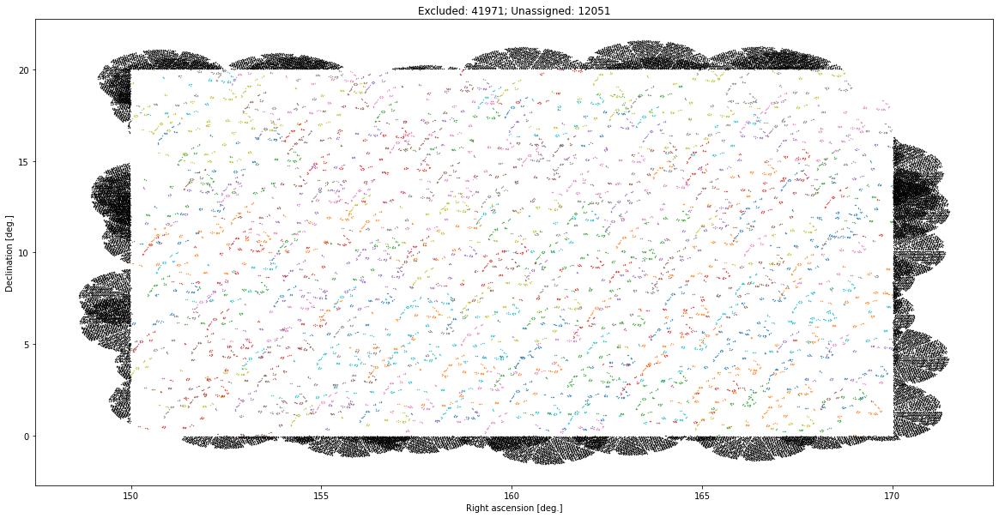

In [114]:
fig, axes   = plt.subplots(1,1,figsize=(20,10))

nexcluded   = 0
nunassigned = 0 

for fba in fbas:
    # Unassigned but not OK. Stuck, Broken or Restricted.
    unassigned = (fba['FASSIGN'].data['FIBERSTATUS'] == 1)
    excluded   = unassigned & ~in_rectange(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    nexcluded += np.count_nonzero(excluded)
    
    # print(np.count_nonzero(excluded))
    
    unassigned = unassigned & ~excluded
    nunassigned += np.count_nonzero(unassigned)
    
    pl.plot(fba['FASSIGN'].data['TARGET_RA'][unassigned], fba['FASSIGN'].data['TARGET_DEC'][unassigned], marker='.', lw=0.0, alpha=1., label=cnt, markersize=.75)
    pl.plot(fba['FASSIGN'].data['TARGET_RA'][excluded], fba['FASSIGN'].data['TARGET_DEC'][excluded], marker='.', lw=0.0, alpha=1., label=cnt, markersize=.75, c='k')
    
pl.xlabel('Right ascension [deg.]')
pl.ylabel('Declination [deg.]')
    
pl.title('Excluded: {}; Unassigned: {}'.format(nexcluded, nunassigned))

Text(0.5, 1.0, 'Fibers: 646240;')

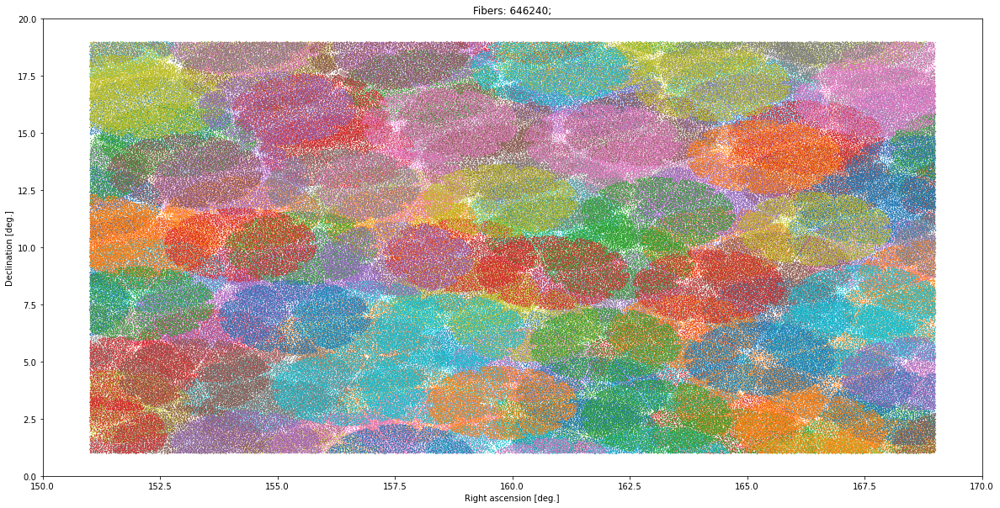

In [115]:
fig, axes = plt.subplots(1,1,figsize=(20,10))

nfiber = 0 

for fba in fbas:
    fibers  = in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])

    nfiber += np.count_nonzero(fibers)
    
    pl.plot(fba['FASSIGN'].data['TARGET_RA'][fibers], fba['FASSIGN'].data['TARGET_DEC'][fibers], marker='.', lw=0.0, alpha=1., label=cnt, markersize=.75)
    
pl.xlabel('Right ascension [deg.]')
pl.ylabel('Declination [deg.]')
pl.xlim(150., 170.)
pl.ylim(0., 20.)    
pl.title('Fibers: {};'.format(nfiber))

Text(0.5, 1.0, 'Stuck: 64912;')

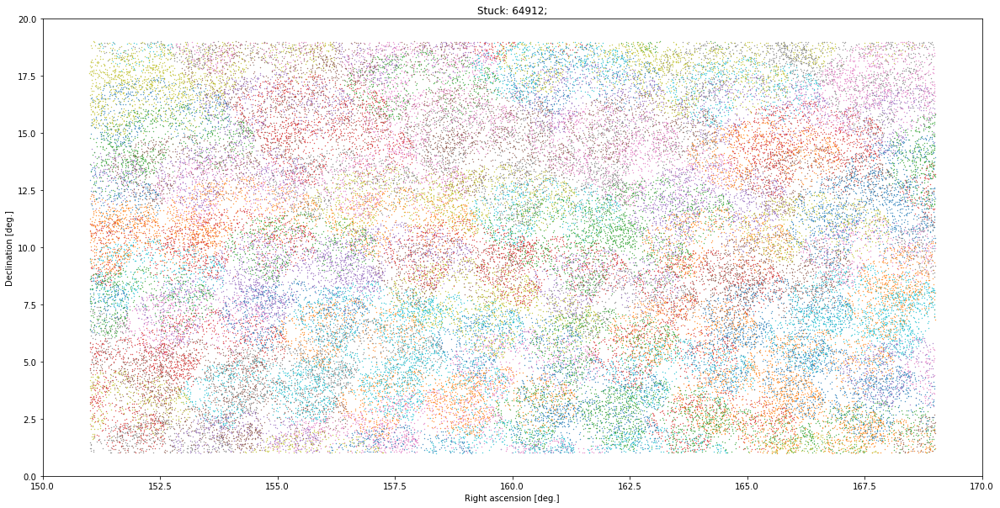

In [116]:
fig, axes = plt.subplots(1,1,figsize=(20,10))

nstuck = 0 

for fba in fbas:
    stuck = (fba['FASSIGN'].data['FIBERSTATUS'] == 3) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    nstuck += np.count_nonzero(stuck)
    
    pl.plot(fba['FASSIGN'].data['TARGET_RA'][stuck], fba['FASSIGN'].data['TARGET_DEC'][stuck], marker='.', lw=0.0, alpha=1., label=cnt, markersize=.75)
    
pl.xlim(150., 170.)
pl.ylim(0., 20.)
pl.xlabel('Right ascension [deg.]')
pl.ylabel('Declination [deg.]')
pl.title('Stuck: {};'.format(nstuck))

Text(0.5, 1.0, 'Unassigned: 101707;')

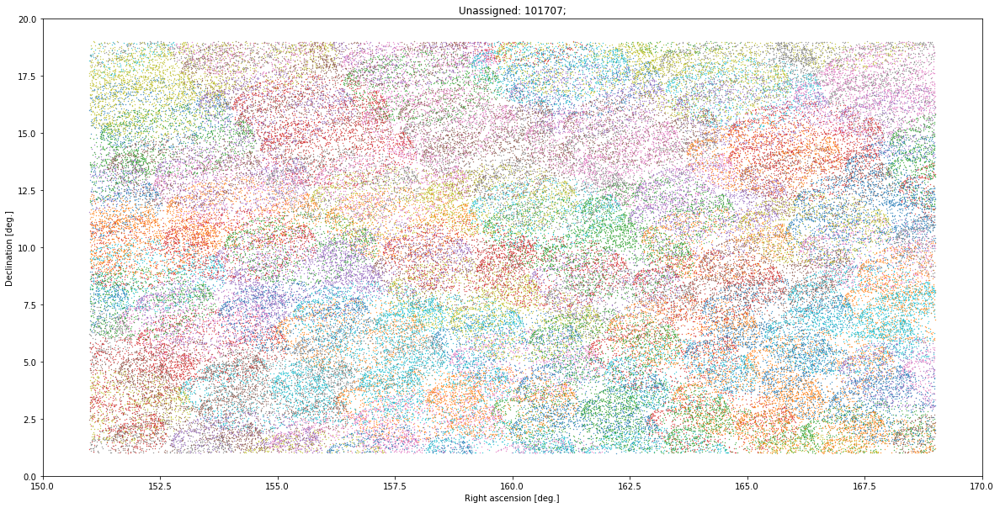

In [117]:
fig, axes = plt.subplots(1,1,figsize=(20,10))

nunassigned = 0 

# ['UNASSIGNED', 'STUCK', 'BROKEN', 'RESTRICT'], [0, 1, 2, 3]
for fba in fbas:
    unassigned = ((fba['FASSIGN'].data['FIBERSTATUS'] & 1) != 0) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])

    nunassigned += np.count_nonzero(unassigned)
    
    pl.plot(fba['FASSIGN'].data['TARGET_RA'][unassigned], fba['FASSIGN'].data['TARGET_DEC'][unassigned], marker='.', lw=0.0, alpha=1., label=cnt, markersize=.75)
    
pl.xlim(150., 170.)
pl.ylim(0., 20.)
pl.xlabel('Right ascension [deg.]')
pl.ylabel('Declination [deg.]')
pl.title('Unassigned: {};'.format(nunassigned))

Text(0.5, 1.0, 'Restrict: 28597;')

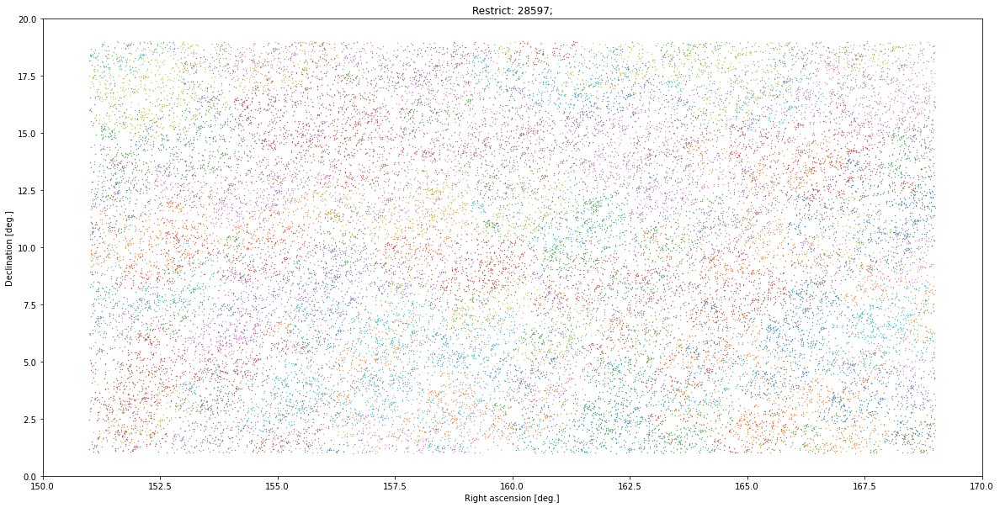

In [118]:
fig, axes = plt.subplots(1,1,figsize=(20,10))

nrestrict = 0 

# ['UNASSIGNED', 'STUCK', 'BROKEN', 'RESTRICT'], [0, 1, 2, 3]
for fba in fbas:
    # restricted, but potentially assigned to target. 
    restrict = ((fba['FASSIGN'].data['FIBERSTATUS'] & 8) != 0) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    # restricted & not assigned to target. 
    # restrict = ((fba['FASSIGN'].data['FIBERSTATUS'] & 2**3) != 0) & (fba['FASSIGN'].data['TARGETID'] < 0) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])

    nrestrict += np.count_nonzero(restrict)
    
    pl.plot(fba['FASSIGN'].data['TARGET_RA'][restrict], fba['FASSIGN'].data['TARGET_DEC'][restrict], marker='.', lw=0.0, alpha=1., label=cnt, markersize=.75)
    
pl.xlim(150., 170.)
pl.ylim(0., 20.)
    
pl.xlabel('Right ascension [deg.]')
pl.ylabel('Declination [deg.]')
    
pl.title('Restrict: {};'.format(nrestrict))

In [119]:
#define TARGET_TYPE_SCIENCE 1
#define TARGET_TYPE_STANDARD 2
#define TARGET_TYPE_SKY 4
#define TARGET_TYPE_SAFE 8
#define TARGET_TYPE_SUPPSKY 16

Text(0.5, 1.0, 'Standard: 18446; Sky: 58191; Safe: 234; Supp sky: 0')

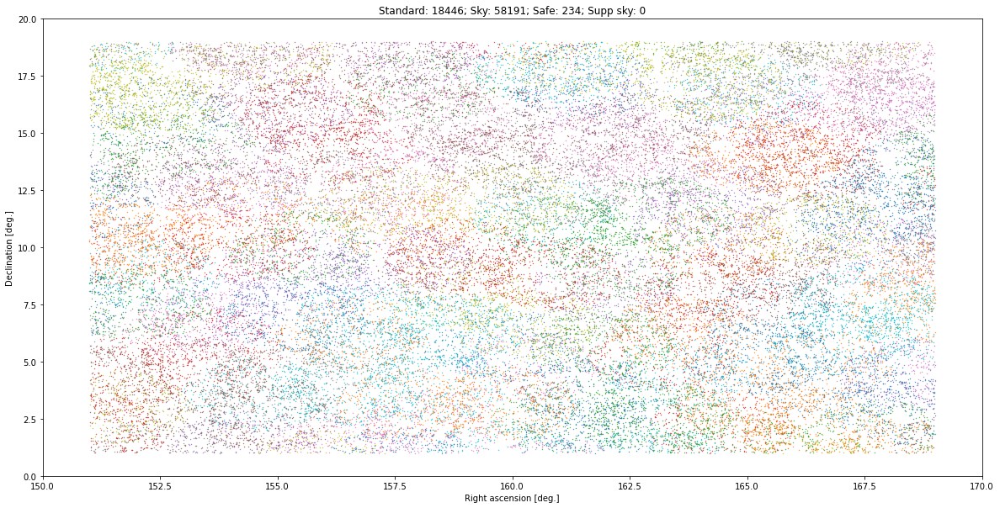

In [130]:
fig, axes = plt.subplots(1,1,figsize=(20,10))

nstandard = 0
nsky      = 0
nsafe     = 0 
nsupp_sky = 0

standard_ids = []

for fba in fbas:
    # standard = ((fba['FASSIGN'].data['FA_TYPE'] & 2**1) != 0) & (~np.isin(fba['FASSIGN'].data['TARGETID'], mws_mtl_sv3['TARGETID'])) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    standard   = ((fba['FASSIGN'].data['FA_TYPE'] & 2**1) != 0) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    sky        = ((fba['FASSIGN'].data['FA_TYPE'] & 2**2) != 0) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    safe       = ((fba['FASSIGN'].data['FA_TYPE'] & 2**3) != 0) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    supp_sky   = ((fba['FASSIGN'].data['FA_TYPE'] & 2**4) != 0) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    nstandard += np.count_nonzero(standard)
    nsky      += np.count_nonzero(sky)
    nsafe     += np.count_nonzero(safe)
    nsupp_sky += np.count_nonzero(supp_sky)
    
    pl.plot(fba['FASSIGN'].data['TARGET_RA'][sky], fba['FASSIGN'].data['TARGET_DEC'][sky], marker='.', lw=0.0, alpha=1., label=cnt, markersize=.75)

    standard_ids += fba['FASSIGN'].data['TARGETID'][standard].tolist()
    
pl.xlim(150., 170.)
pl.ylim(0., 20.)
    
pl.xlabel('Right ascension [deg.]')
pl.ylabel('Declination [deg.]')
    
pl.title('Standard: {}; Sky: {}; Safe: {}; Supp sky: {}'.format(nstandard, nsky, nsafe, nsupp_sky))

In [131]:
len(standard_ids)

18446

In [132]:
mws_mtl_sv3_repeats = mws_mtl_sv3[np.isin(mws_mtl_sv3['TARGETID'], repeat_ids)]

In [133]:
len(mws_mtl_sv3_repeats), len(repeat_ids)

(27608, 36394)

In [135]:
np.mean(np.isin(standard_ids, repeat_ids))

0.6151469153203947

In [244]:
for fba in fbas:
    standard    = ((fba['FASSIGN'].data['FA_TYPE'] & 2**1) != 0) & (~np.isin(fba['FASSIGN'].data['TARGETID'], mws_mtl_sv3['TARGETID'])) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])    
    standard_id = fba['FASSIGN'].data['TARGETID'][standard]
    
    # print(np.count_nonzero(np.isin(standard_id, repeat_ids)))

In [148]:
bgs_mtl_sv3_repeats = bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], repeat_ids)]

In [149]:
len(bgs_mtl_sv3_repeats), len(repeat_ids)

(8770, 36394)

In [134]:
nrepeat_mws_conservative = np.count_nonzero(in_conservative_rectangle(mws_mtl_sv3_repeats['RA'], mws_mtl_sv3_repeats['DEC']))

In [135]:
nrepeat_mws_conservative

25371

In [150]:
nrepeat_bgs_conservative = np.count_nonzero(in_conservative_rectangle(bgs_mtl_sv3_repeats['RA'], bgs_mtl_sv3_repeats['DEC']))

In [151]:
nrepeat_bgs_conservative

8258

0 40
1 39
2 41
3 40


Text(0.5, 1.0, 'Repeats: 47487;')

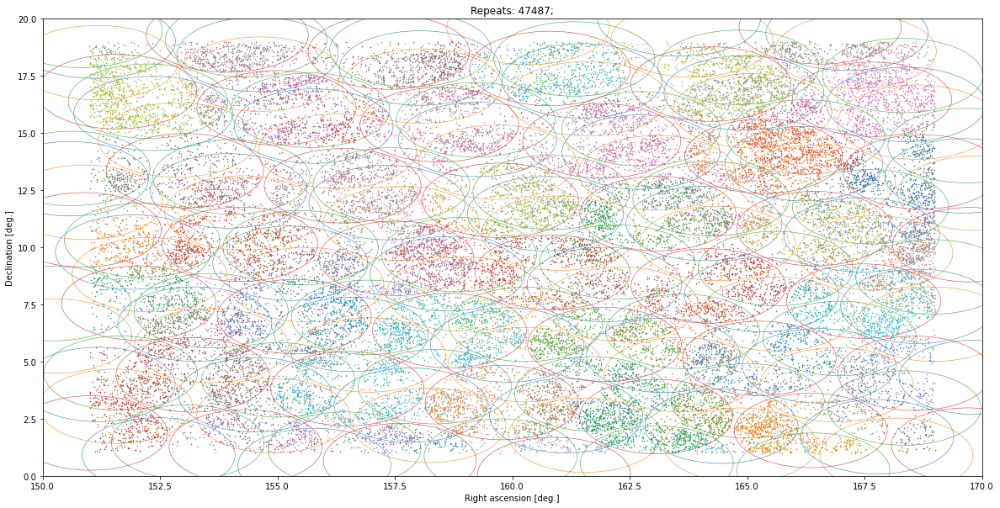

In [136]:
fig, axes = plt.subplots(1,1,figsize=(20,10))

nrepeat = 0 

for fba in fbas:
    is_repeat = np.isin(fba['FASSIGN'].data['TARGETID'], repeat_ids) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    pl.plot(fba['FASSIGN'].data['TARGET_RA'][is_repeat], fba['FASSIGN'].data['TARGET_DEC'][is_repeat], marker='.', lw=0.0, alpha=1., label=cnt, markersize=.75)
    
    nrepeat += np.count_nonzero(is_repeat)
    
for ppass, color in zip(range(4), colors):
    in_pass=btiles['PASS'] == ppass
    
    theta = (np.pi / 2.) - (btiles['DEC'][in_pass] * np.pi / 180.) 
    ellipses(btiles['RA'][in_pass], btiles['DEC'][in_pass], w=2.*tile_rad / np.sin(theta), h=2.*tile_rad, c=color, alpha=1., fc='none', lw=0.5)
    
    print(ppass, np.count_nonzero(in_pass))
            
pl.xlim(150., 170.)
pl.ylim(0., 20.)
        
pl.xlabel('Right ascension [deg.]')
pl.ylabel('Declination [deg.]')
    
pl.title('Repeats: {};'.format(nrepeat - nrepeat_mws_conservative))

In [137]:
accounted_frac = []

for i, fba in enumerate(fbas):
    fibers     = in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    unassigned = ((fba['FASSIGN'].data['FIBERSTATUS'] & 2**0) != 0) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    sky        = ((fba['FASSIGN'].data['FA_TYPE'] & 2**2) != 0) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    bgs        = (np.isin(fba['FASSIGN'].data['TARGETID'], bgs_mtl_sv3['TARGETID'])) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    mws        = (np.isin(fba['FASSIGN'].data['TARGETID'], mws_mtl_sv3['TARGETID'])) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    accounted  = unassigned | sky | bgs | mws 
    
    if np.count_nonzero(fibers):
        accounted_frac.append([i, np.count_nonzero(accounted) / np.count_nonzero(fibers)])

In [138]:
accounted_frac = np.array(accounted_frac)

In [139]:
idx = np.argsort(accounted_frac[:,1])

In [140]:
accounted_frac[idx][:10]

array([[ 70.        ,   0.98818381],
       [121.        ,   0.99555753],
       [ 81.        ,   0.99644286],
       [ 78.        ,   0.99655618],
       [ 43.        ,   0.99676724],
       [118.        ,   0.99740428],
       [ 13.        ,   0.9979988 ],
       [155.        ,   0.9979988 ],
       [ 34.        ,   0.9982669 ],
       [ 69.        ,   0.99829932]])

0 40
1 39
2 41
3 40


Text(0.5, 1.0, 'Repeats: 47487;')

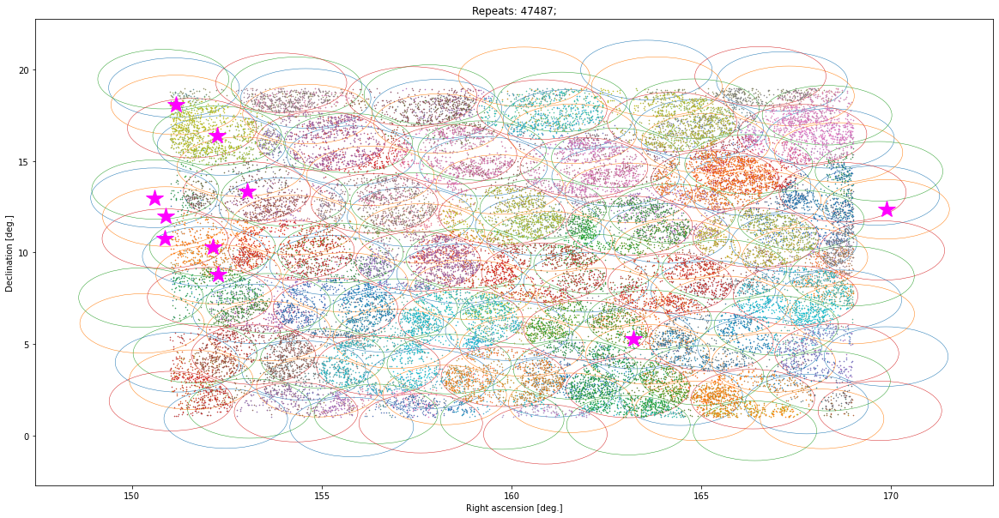

In [141]:
fig, axes = plt.subplots(1,1,figsize=(20,10))

nrepeat = 0 

for fba in fbas:
    is_repeat = np.isin(fba['FASSIGN'].data['TARGETID'], repeat_ids) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    pl.plot(fba['FASSIGN'].data['TARGET_RA'][is_repeat], fba['FASSIGN'].data['TARGET_DEC'][is_repeat], marker='.', lw=0.0, alpha=1., label=cnt, markersize=.75)
    
    nrepeat += np.count_nonzero(is_repeat)
    
for ppass, color in zip(range(4), colors):
    in_pass=btiles['PASS'] == ppass
    
    theta = (np.pi / 2.) - (btiles['DEC'][in_pass] * np.pi / 180.) 
    ellipses(btiles['RA'][in_pass], btiles['DEC'][in_pass], w=2.*tile_rad / np.sin(theta), h=2.*tile_rad, c=color, alpha=1., fc='none', lw=0.5)
    
    print(ppass, np.count_nonzero(in_pass))
        
for i in idx[:10]:
    ra  = fbas[np.int(accounted_frac[i][0])][0].header['TILERA']
    dec = fbas[np.int(accounted_frac[i][0])][0].header['TILEDEC']

    pl.plot(ra, dec, marker='*', c='magenta', markersize=20)
    
pl.xlabel('Right ascension [deg.]')
pl.ylabel('Declination [deg.]')
    
pl.title('Repeats: {};'.format(nrepeat - nrepeat_mws_conservative))

In [145]:
nzeros       = 0
nsecondaries = 0

for row in accounted_frac[idx]:
    fba        = fbas[np.int(row[0])]
    
    fibers     = in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])

    unassigned = ((fba['FASSIGN'].data['FIBERSTATUS'] & 2**0) != 0) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    sky        = ((fba['FASSIGN'].data['FA_TYPE'] & 2**2) != 0) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    bgs        = (np.isin(fba['FASSIGN'].data['TARGETID'], bgs_mtl_sv3['TARGETID'])) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    mws        = (np.isin(fba['FASSIGN'].data['TARGETID'], mws_mtl_sv3['TARGETID'])) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    accounted  = unassigned | sky | bgs | mws 
    
    # np.count_nonzero(accounted) / np.count_nonzero(fibers)
    
    # fba[0].header['TILERA'], fba[0].header['TILEDEC']
    
    # PV_BRIGHT_HIGH: {UNOBS: 1700}
    # PSF_OUT_BRIGHT: {UNOBS: 90}
    # PV_BRIGHT_LOW:  {UNOBS: 1005}
    prioritys  = Table(fba['FTARGETS'].data)[np.isin(Table(fba['FTARGETS'].data)['TARGETID'], Table(fba['FASSIGN'].data[fibers & ~accounted])['TARGETID'])]['PRIORITY']

    upriority, cnts = np.unique(prioritys.data, return_counts=True)
    
    if len(cnts) > 0:
        nzeros += cnts[0]
        nsecondaries += np.sum(cnts[1:])
    
        # print(upriority)
    
        assert np.all(np.isin(upriority, np.array([0, 90, 1005, 1700])))

In [146]:
nzeros

312

In [144]:
nsecondaries

0

In [159]:
# 25371. + 8258.
646240. - (101707. + 58191. + 346098. + 100788. + 39223 + 312.)

-79.0

0	63483	167.44	10.54	4176	2421	388	888	413	110	56.47366304784882
	 [-1, 0, 101400, 101500, 101550, 102000, 102998]
	 [409, 3, 112, 331, 1, 501, 19]

0	63484	168.63	7.42	2689	1527	261	619	250	68	56.19107479572596
	 [-1, 0, 101400, 101500, 101600, 102000, 102998]
	 [249, 1, 44, 232, 1, 363, 12]

0	63486	169.60	13.12	1142	689	110	258	107	27	57.030692362598145
	 [-1, 0, 101400, 101500, 101600, 102000, 102998]
	 [107, 2, 7, 67, 1, 151, 8]

0	63488	166.21	13.65	4190	2319	367	938	400	116	53.75225135081049
	 [-1, 101400, 101500, 101600, 102000, 102998]
	 [396, 132, 380, 3, 569, 30]

0	63489	164.08	11.04	4190	2692	357	804	400	101	61.01660996597959
	 [-1, 0, 101400, 101500, 101550, 102000, 102998]
	 [394, 1, 39, 248, 1, 447, 18]

0	63490	165.31	7.93	4190	2723	400	835	400	104	62.49749849909946
	 [-1, 0, 101400, 101500, 101550, 101600, 102000, 102998]
	 [393, 1, 4, 220, 2, 2, 436, 19]

0	63492	169.87	4.31	731	460	61	143	65	22	57.82463928967814
	 [-1, 101400, 101500, 101550, 102000, 102998]
	 [65, 

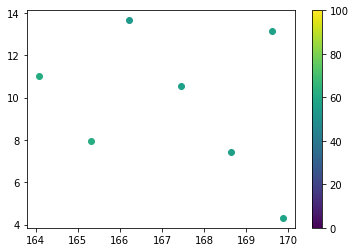

In [241]:
effs = []

for i, fba in enumerate(fbas):
    # ['UNASSIGNED', 'STUCK', 'BROKEN', 'RESTRICT'], [0, 1, 2, 3]
    fibers      = in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    available   = (fba['FASSIGN'].data['FIBERSTATUS'] == 0) & fibers
    
    unassigned  = ((fba['FASSIGN'].data['FIBERSTATUS'] & 2**0) != 0) & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    standard    = ((fba['FASSIGN'].data['FA_TYPE'] & 2**1) != 0)     & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    sky         = ((fba['FASSIGN'].data['FA_TYPE'] & 2**2) != 0)     & in_conservative_rectangle(fba['FASSIGN'].data['TARGET_RA'], fba['FASSIGN'].data['TARGET_DEC'])
    
    tileid      = fba[0].header['TILEID']
    ppass       = btiles[btiles['TILEID'] == tileid]['PASS'][0]
    tilera      = btiles[btiles['TILEID'] == tileid]['RA'][0]
    tiledec     = btiles[btiles['TILEID'] == tileid]['DEC'][0]
    
    bgs         = (np.isin(fba['FASSIGN'].data['TARGETID'], bgs_mtl_sv3['TARGETID'])) & fibers
    bgs_ids     = fba['FASSIGN'].data['TARGETID'][bgs]
    
    bgs         = bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], bgs_ids)]
    
    # 102100
    bgs_bright  = bgs[(bgs['SV3_BGS_TARGET'] & bgs_mask['BGS_BRIGHT'])    != 0]
    bgs_faint   = bgs[(bgs['SV3_BGS_TARGET'] & bgs_mask['BGS_FAINT'])     != 0]
    bgs_hip     = bgs[(bgs['SV3_BGS_TARGET'] & bgs_mask['BGS_FAINT_HIP']) != 0]
    
    nbgs_bright = len(bgs_bright)
    nbgs_faint  = len(bgs_faint)
    nbgs_hip    = len(bgs_hip)
    
    #define TARGET_TYPE_SCIENCE 1
    #define TARGET_TYPE_STANDARD 2
    #define TARGET_TYPE_SKY 4
    #define TARGET_TYPE_SAFE 8
    #define TARGET_TYPE_SUPPSKY 16
    
    # 400 required per tile. 
    nsky        = np.count_nonzero(sky)
    nstandard   = np.count_nonzero(standard) 
    navailable  = np.count_nonzero(available)
    
    if np.count_nonzero(fibers) > 0: 
        eff     = 100. * (nbgs_bright + nbgs_hip) / np.count_nonzero(fibers)
        
        print('{}\t{}\t{:.2f}\t{:.2f}\t{}\t{}\t{}\t{}\t{}\t{}\t{}'.format(ppass, tileid, tilera, tiledec, navailable, nbgs_bright, nbgs_hip, nbgs_faint, nsky, nstandard, eff))
    
        effs.append(eff)
        
        pl.scatter(tilera, tiledec, c=eff, vmin=0., vmax=100.)
    
    joint       = join(fba['FTARGETS'].data, fba['FASSIGN'].data, join_type='left', keys='TARGETID') 
    joint       = joint[(joint['FIBERSTATUS'] == 0) & in_conservative_rectangle(joint['TARGET_RA_1'], joint['TARGET_DEC_1'])]
    
    joint       = joint[~np.isin(joint['TARGETID'], bgs_bright['TARGETID'])]
    joint       = joint[~np.isin(joint['TARGETID'], bgs_hip['TARGETID'])]
    
    upriority, cnts = np.unique(joint['PRIORITY'].data, return_counts=True)  
        
    # assert len(upriority) == len(cnts)
 
    # QSO: {UNOBS: 103400};  LRG: {UNOBS: 103200}; BGS_FAINT: {UNOBS: 102000}; 
    #
    # [-1, 101400, 101500, 101600, 102000, 102998, 103000, 103100, 103200, 103400]
    #
    # [398,   113,    225,      2,    381,     21,      1,      2,    148,     38]
    
    print('\t', upriority.tolist())
    print('\t', cnts.tolist())
    print()

    if i>5:
        break
    
pl.colorbar()
    
effs = np.array(effs)

In [232]:
np.sort(effs)

array([15.46023235, 18.73498799, 21.09265559, 21.83173589, 22.15311005,
       22.25335201, 23.23394036, 23.65419252, 24.01614531, 24.35461277,
       24.59893048, 24.6835443 , 24.76722533, 24.90801019, 25.11990408,
       25.13508105, 25.39523714, 26.43143883, 26.43586152, 26.56597068,
       26.57594557, 26.63598159, 26.67727996, 26.79039742, 26.97618571,
       27.19631779, 27.2163298 , 27.25635381, 27.35641385, 27.39643786,
       27.4964979 , 27.52721617, 27.63658195, 28.00620636, 28.07684611,
       28.87240356, 28.95737442, 29.07744647, 29.29757855, 29.56953642,
       29.57961228, 29.59775866, 29.92125984, 30.18018018, 30.33419023,
       30.45317221, 30.57834701, 30.69841905, 31.05863518, 31.49889934,
       31.58883521, 31.75905543, 31.85803758, 32.13894967, 32.33940364,
       32.55953572, 32.74929699, 32.77800916, 32.85971583, 32.96803653,
       33.71529308, 34.23743886, 34.36578171, 34.40064038, 35.07297656,
       35.16853933, 35.22473701, 35.3821907 , 35.48128877, 35.96

In [239]:
# pl.hist(effs, bins=np.arange(0.0, 100., 5.))

In [292]:
#define TARGET_TYPE_SCIENCE 1
#define TARGET_TYPE_STANDARD 2
#define TARGET_TYPE_SKY 4
#define TARGET_TYPE_SAFE 8
#define TARGET_TYPE_SUPPSKY 16

In [121]:
# define FIBER_STATE_OK 0
# define FIBER_STATE_UNASSIGNED 1
# define FIBER_STATE_STUCK 2
# define FIBER_STATE_BROKEN 4
# define FIBER_STATE_RESTRICT 8

In [122]:
# np.unique(fiberstat, return_counts=True)

In [226]:
np.mean(np.isin(mws_mtl_sv3['TARGETID'], uavail))

0.9748216652899483

In [227]:
avail = vstack((Table(bgs_mtl_sv3[np.isin(bgs_mtl_sv3['TARGETID'], uavail)]), Table(mws_mtl_sv3[np.isin(mws_mtl_sv3['TARGETID'], uavail)])))

In [228]:
# BGS_BRIGHT:    {UNOBS: 102100, MORE_ZWARN: 102100, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# BGS_FAINT_HIP: {UNOBS: 102100, MORE_ZWARN: 102100, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# BGS_FAINT:     {UNOBS: 102000, MORE_ZWARN: 102000, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# BGS_WISE:      {UNOBS: 102000, MORE_ZWARN: 102000, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}

# MWS_WD:        {UNOBS: 102998, MORE_ZWARN: 102998, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# MWS_NEARBY:    {UNOBS: 101600, MORE_ZWARN: 101600, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# MWS_BHB:       {UNOBS: 101550, MORE_ZWARN: 101550, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# MWS_MAIN_BLUE: {UNOBS: 101500, MORE_ZWARN: 101500, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}
# MWS_MAIN_RED:  {UNOBS: 101500, MORE_ZWARN: 101500, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}    
# MWS_BROAD:     {UNOBS: 101400, MORE_ZWARN: 101400, MORE_ZGOOD: 2, DONE: 2, OBS: 1, DONOTOBSERVE: 0, MORE_MIDZQSO: 0, ZWARN_DECREMENT: 10000}

In [229]:
upriors, __cnts__ = np.unique(avail[np.isin(avail['TARGETID'], repeat_ids)]['PRIORITY_INIT'], return_counts=True)

In [230]:
for u, c in zip(upriors[::-1], __cnts__[::-1]):
    print(u, c)

102998 1218
102100 6899
102000 1872
101600 152
101550 153
101500 20366
101400 5718


# Done.